In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.arima.model import ARIMA
from transformers import pipeline
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.stattools import adfuller, kpss
import pymannkendall as mk
from math import sqrt
import pmdarima as pm
from pmdarima.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
import json
import ast
import locale
locale.setlocale(locale.LC_ALL, "nl_NL")

'nl_NL'

In [3]:
with open('paper_selectors.txt', 'r') as file:
    papers = ast.literal_eval(file.read())

with open('party_selectors.txt', 'r') as file:
    parties = ast.literal_eval(file.read())

with open('party_synonyms.txt', 'r') as file:
    party_synonyms = ast.literal_eval(file.read())

with open('months.txt', 'r') as file:
    months = ast.literal_eval(file.read())

with open('min_mentions_per_article.txt', 'r') as file:
    min_val = int(file.read())

In [4]:
for synonym in party_synonyms:
    parties = [x for x in parties if x not in synonym[1:]]

In [5]:
with open("../../data/04_sentiment_per_party.json") as file:
    data = json.load(file)

party_sentiment = {key: pd.DataFrame(data[key]) for key in data}

In [6]:
descriptives = pd.DataFrame()
for party in parties:
    for sentiment in ['body_neu']:
        # print(f"{party} {sentiment}")
        # display(party_sentiment[party][sentiment].describe())
        descriptives[f"{party} {sentiment}"] = party_sentiment[party][sentiment]

display(descriptives.stack().reset_index())

,level_0,level_1,0
0,2023-08-21,VVD body_neu,0.835154
1,2023-08-21,CDA body_neu,0.845000
2,2023-08-21,D66 body_neu,0.811667
3,2023-08-21,SGP body_neu,0.845500
4,2023-08-21,GroenLinks-PvdA body_neu,0.815333
...,...,...,...
1460,2023-12-06,Denk body_neu,0.801400
1461,2023-12-06,Bij1 body_neu,0.812000
1462,2023-12-06,BBB body_neu,0.837944
1463,2023-12-06,BVNL body_neu,0.795000


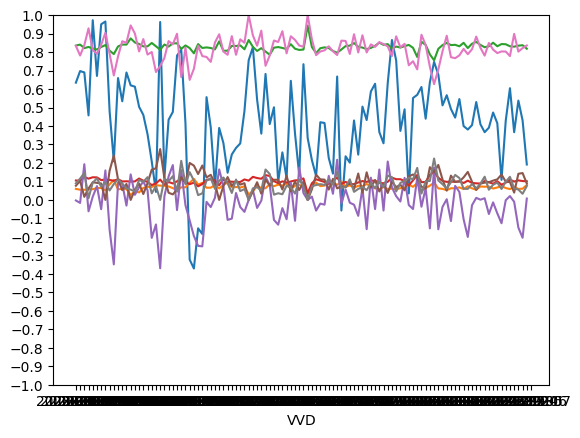

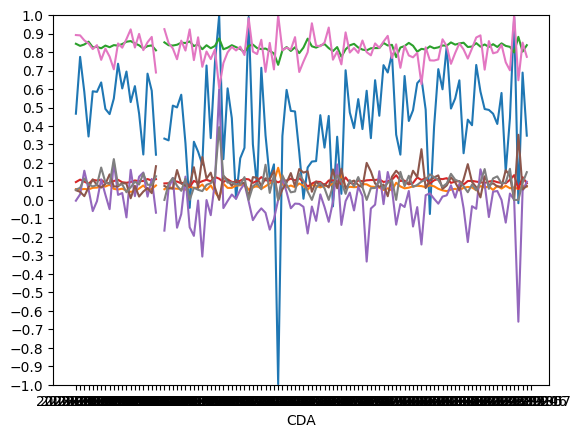

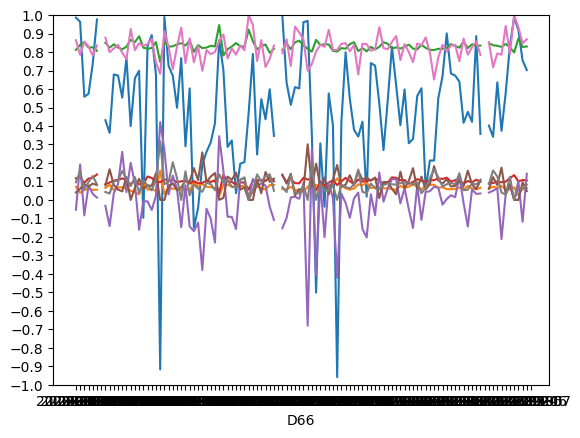

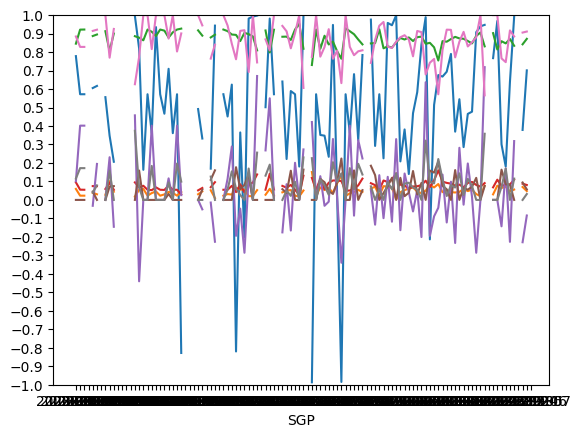

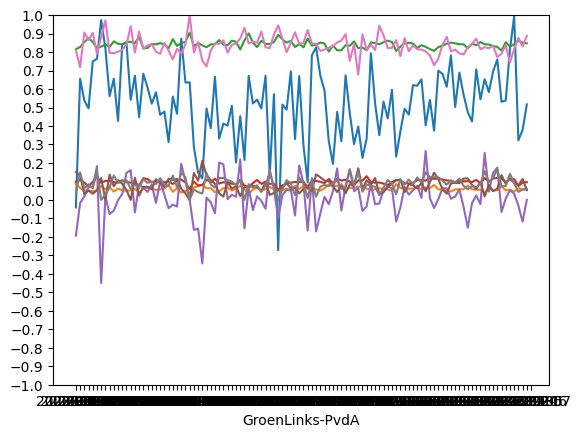

...

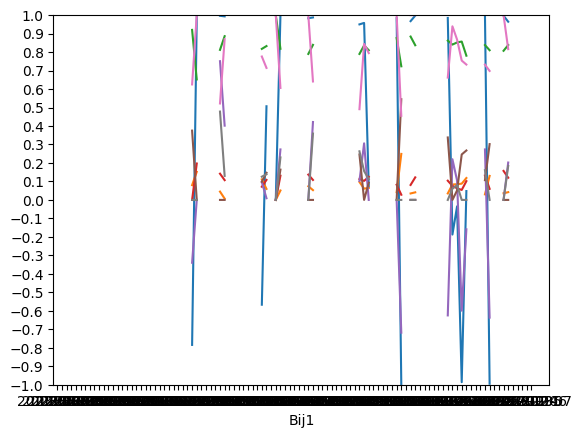

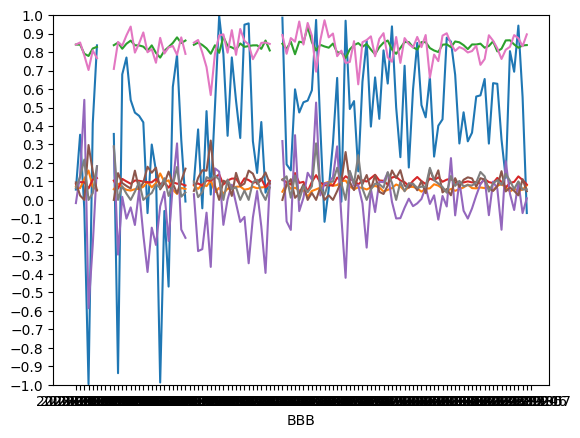

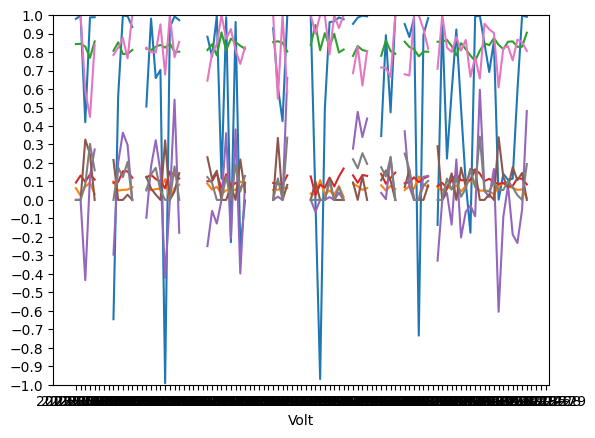

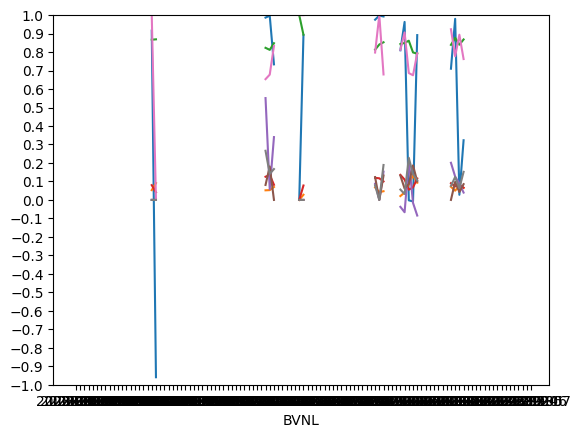

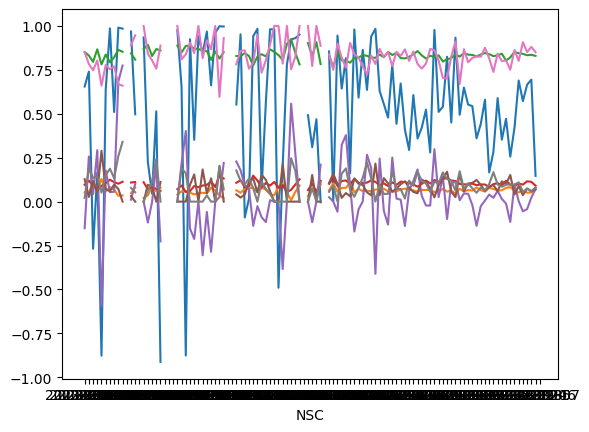

In [7]:
for idx, party_data in enumerate(parties):
    plt.ylim(0, 1.0)
    plt.yticks(np.arange(-1,1.1, step=0.1))
    # plt.xticks(rotation=45)
    plt.figure(idx+1)
    plt.plot(party_sentiment[party_data])
    plt.xlabel(party_data)

plt.show()

/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/graphics/utils.py:55: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure()


50Plus has insufficient data for PACF
50Plus has insufficient data for PACF
50Plus has insufficient data for PACF
50Plus has insufficient data for PACF
BVNL has insufficient data for PACF
BVNL has insufficient data for PACF
BVNL has insufficient data for PACF
BVNL has insufficient data for PACF


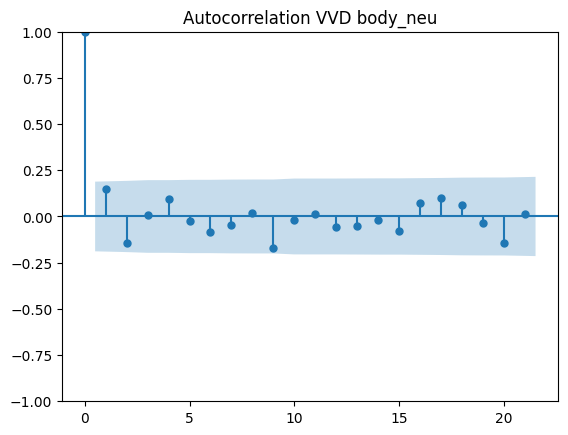

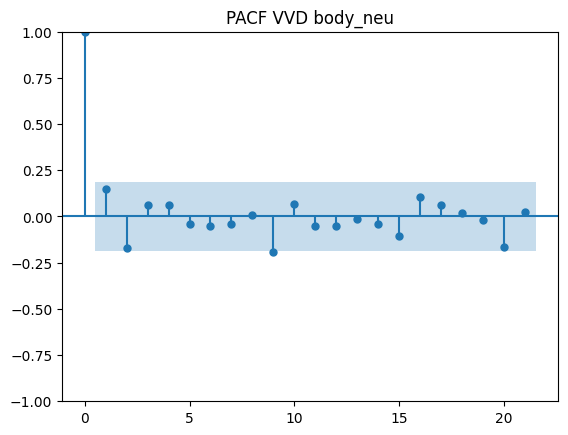

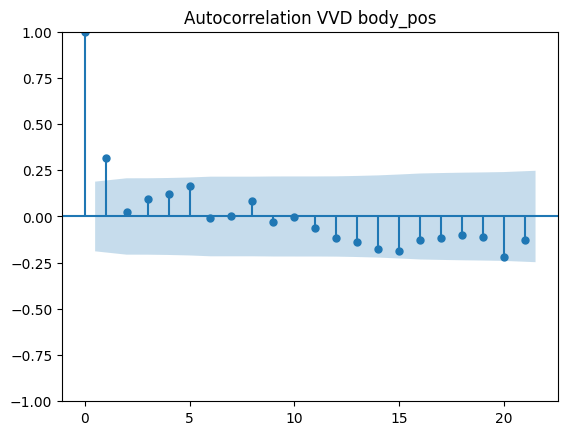

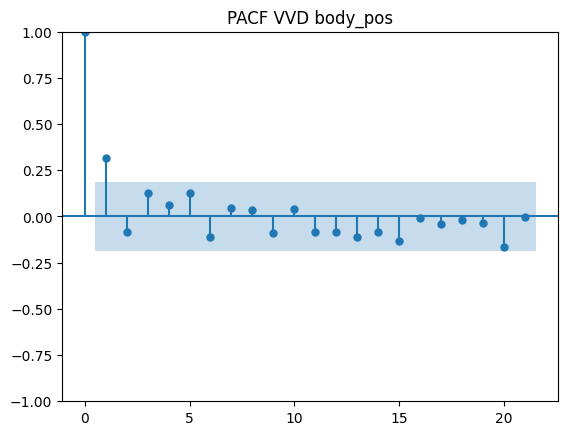

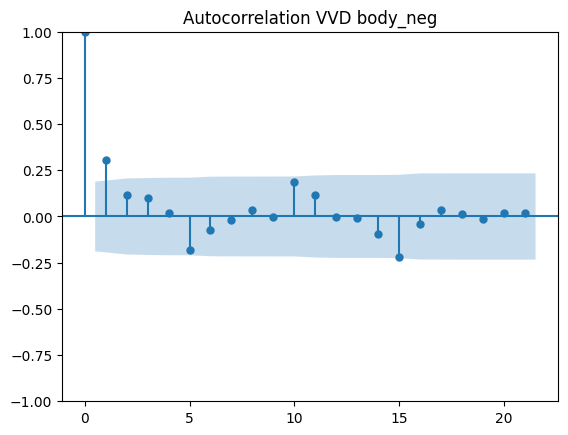

...

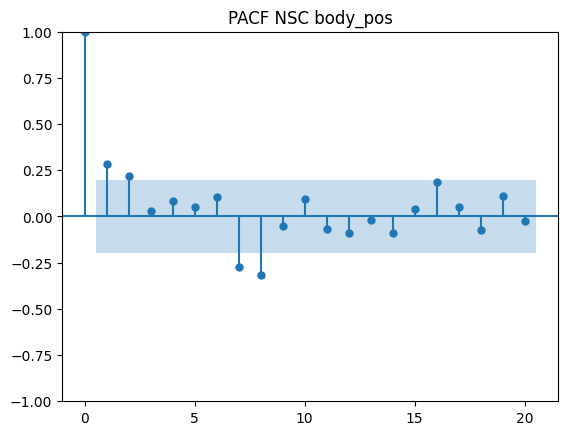

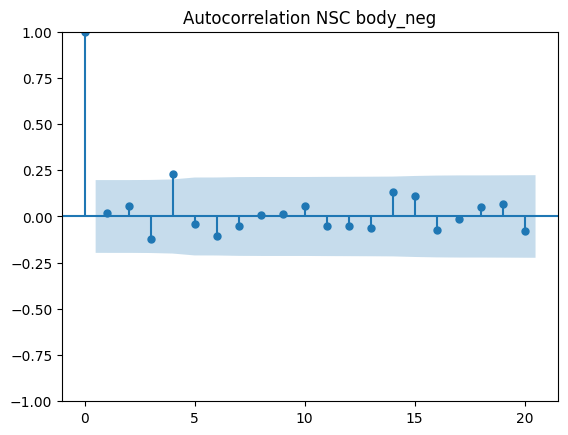

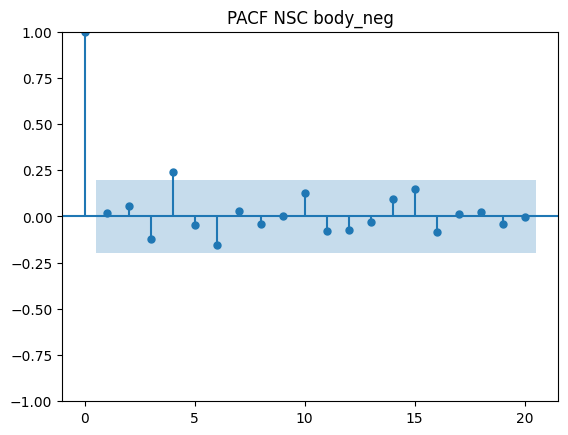

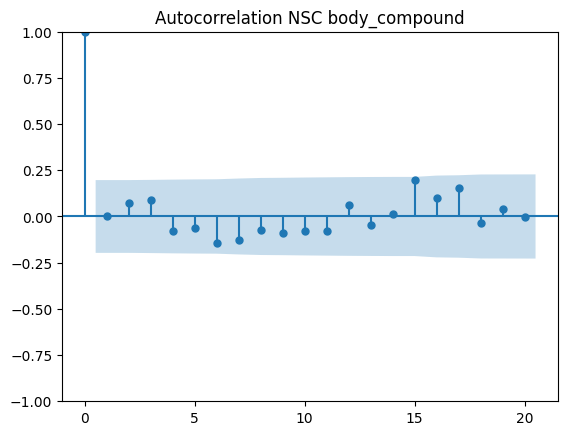

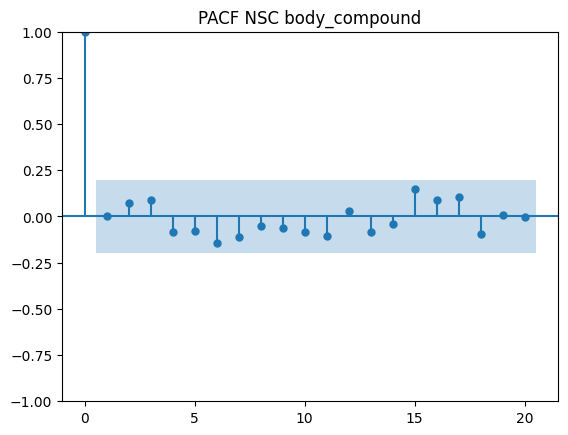

In [8]:
sentiments = ['body_neu', 'body_pos', 'body_neg', 'body_compound']

for party_data in parties:
    for sentiment in sentiments:
        try:
            plot_acf(party_sentiment[party_data][sentiment].dropna(), title=f"Autocorrelation {party_data} {sentiment}")
            plot_pacf(party_sentiment[party_data][sentiment].dropna(), title=f"PACF {party_data} {sentiment}")
        except ValueError:
            print(f"{party_data} has insufficient data for PACF")

In [9]:
def adfuller_test(name, party_data, type):
    result=adfuller(party_data, regression='ct')
    labels = ['ADF:','p-value:','N Lags:','N Observations', 'crit vals']
    print(f"{name} {type}")
    for value,label in zip(result,labels):
        print(label+' : '+str(value) )
    if result[1] <= 0.05:
        print(f"P value is less than 0.05 for {name} means we can reject the null hypothesis(Ho). We can conclude that data has no unit root and is stationary")
        return 0
    else:
        print(f"Weak evidence against null hypothesis for {name} means time series has a unit root which indicates that it is non-stationary ")
        return 1
    
for party in parties:
    for sentiment in sentiments:
        adfuller_test(party, party_sentiment[party][sentiment].dropna(), sentiment)
        print("")

VVD body_neu
ADF: : -7.877822188115288
p-value: : 1.3692201330935133e-10
N Lags: : 1
N Observations : 106
crit vals : {'1%': -4.0468193247781725, '5%': -3.452751165593073, '10%': -3.151810567112449}
P value is less than 0.05 for VVD means we can reject the null hypothesis(Ho). We can conclude that data has no unit root and is stationary

VVD body_pos
ADF: : -7.384734531746072
p-value: : 1.8752635604818548e-09
N Lags: : 0
N Observations : 107
crit vals : {'1%': -4.045970933273362, '5%': -3.452348053635668, '10%': -3.1515755794286404}
P value is less than 0.05 for VVD means we can reject the null hypothesis(Ho). We can conclude that data has no unit root and is stationary

VVD body_neg
ADF: : -7.407314560537847
p-value: : 1.6643456167434835e-09
N Lags: : 0
N Observations : 107
crit vals : {'1%': -4.045970933273362, '5%': -3.452348053635668, '10%': -3.1515755794286404}
P value is less than 0.05 for VVD means we can reject the null hypothesis(Ho). We can conclude that data has no unit root

In [10]:
def kpss_test(name, party):
    result=kpss(party)
    labels = ['KPSS:','p-value:','N Lags:','crit values:']
    print(name)
    for value,label in zip(result,labels):
        print(label+' : '+str(value) )
    if result[0] >= result[3]['5%']:
        print(f"P value is less than 0.05 for {name} means we can reject the null hypothesis(Ho). We can conclude that the data is non-stationary")
        return 0
    else:
        print(f"Weak evidence against null hypothesis for {name} indicates that it is stationary ")
        return 1

for party_data in parties:
    for sentiment in sentiments:
        print(sentiment)
        kpss_test(party_data, party_sentiment[party_data][sentiment].dropna())
        print("")

body_neu
VVD
KPSS: : 0.08447798545400885
p-value: : 0.1
N Lags: : 2
crit values: : {'10%': 0.347, '5%': 0.463, '2.5%': 0.574, '1%': 0.739}
Weak evidence against null hypothesis for VVD indicates that it is stationary 

body_pos
VVD
KPSS: : 0.10368333134211907
p-value: : 0.1
N Lags: : 3
crit values: : {'10%': 0.347, '5%': 0.463, '2.5%': 0.574, '1%': 0.739}
Weak evidence against null hypothesis for VVD indicates that it is stationary 

body_neg
VVD
KPSS: : 0.15462994010353462
p-value: : 0.1
N Lags: : 3
crit values: : {'10%': 0.347, '5%': 0.463, '2.5%': 0.574, '1%': 0.739}
Weak evidence against null hypothesis for VVD indicates that it is stationary 

body_compound
VVD
KPSS: : 0.17415896979255766
p-value: : 0.1
N Lags: : 4
crit values: : {'10%': 0.347, '5%': 0.463, '2.5%': 0.574, '1%': 0.739}
Weak evidence against null hypothesis for VVD indicates that it is stationary 

body_neu
CDA
KPSS: : 0.307477472149531
p-value: : 0.1
N Lags: : 3
crit values: : {'10%': 0.347, '5%': 0.463, '2.5%': 0.

/var/folders/9z/gq738z712wv0tz09r4b4vw6c0000gn/T/ipykernel_12835/3212553297.py:2: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  result=kpss(party)
/var/folders/9z/gq738z712wv0tz09r4b4vw6c0000gn/T/ipykernel_12835/3212553297.py:2: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  result=kpss(party)
/var/folders/9z/gq738z712wv0tz09r4b4vw6c0000gn/T/ipykernel_12835/3212553297.py:2: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  result=kpss(party)
/var/folders/9z/gq738z712wv0tz09r4b4vw6c0000gn/T/ipykernel_12835/3212553297.py:2: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table.

count    107.000000
mean      -0.000001
std        0.021182
min       -0.064082
25%       -0.011177
50%        0.000463
75%        0.009619
max        0.117308
dtype: float64


/var/folders/9z/gq738z712wv0tz09r4b4vw6c0000gn/T/ipykernel_12835/3254081223.py:25: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_xticklabels(np.arange(0,len(party_sentiment[party_data]),10))


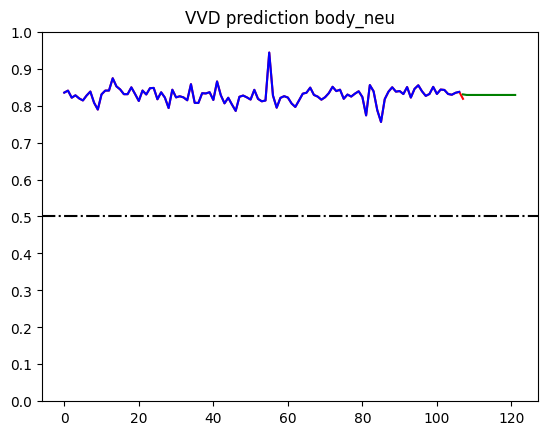

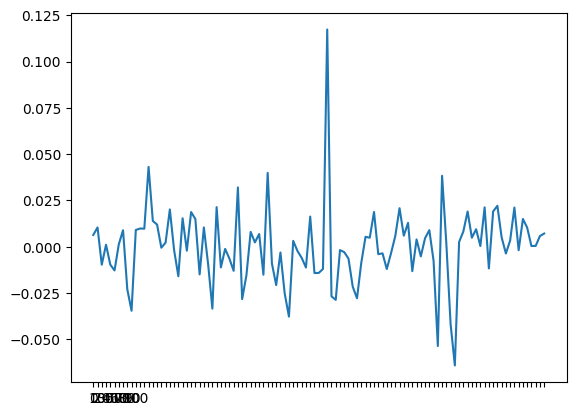

count    107.000000
mean      -0.000007
std        0.013784
min       -0.070235
25%       -0.006244
50%        0.000576
75%        0.006243
max        0.036570
dtype: float64


/var/folders/9z/gq738z712wv0tz09r4b4vw6c0000gn/T/ipykernel_12835/3254081223.py:25: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_xticklabels(np.arange(0,len(party_sentiment[party_data]),10))


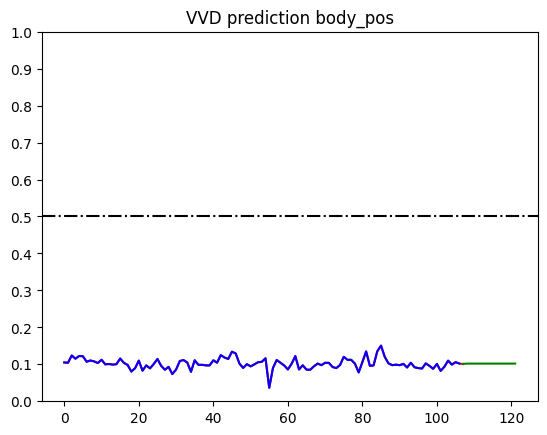

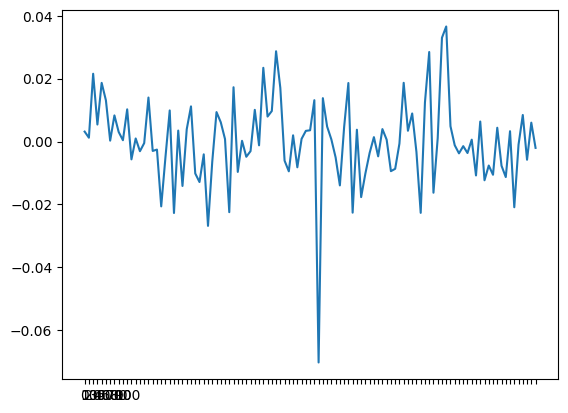

count    107.000000
mean       0.000034
std        0.014319
min       -0.049395
25%       -0.008343
50%       -0.001023
75%        0.008178
max        0.036981
dtype: float64


/var/folders/9z/gq738z712wv0tz09r4b4vw6c0000gn/T/ipykernel_12835/3254081223.py:25: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_xticklabels(np.arange(0,len(party_sentiment[party_data]),10))


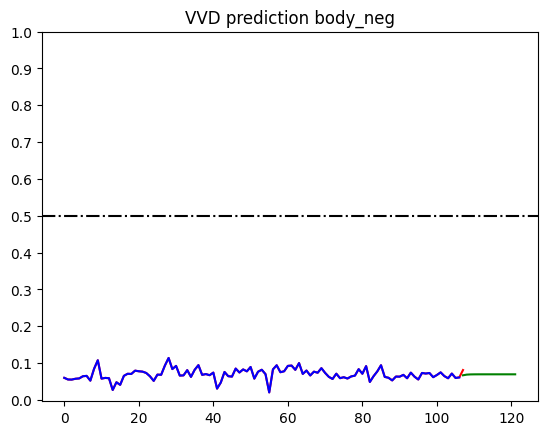

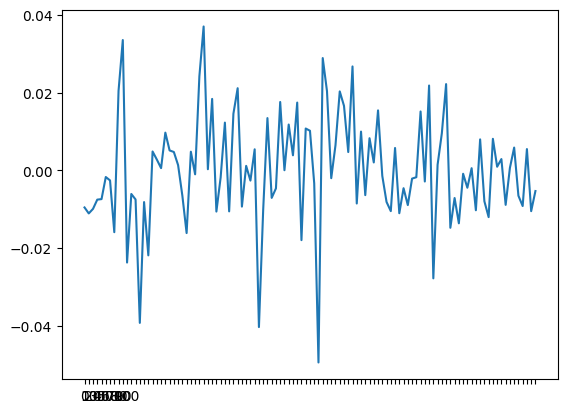

count    107.000000
mean      -0.000701
std        0.237783
min       -0.751367
25%       -0.150174
50%       -0.011956
75%        0.138024
max        0.676245
dtype: float64


/var/folders/9z/gq738z712wv0tz09r4b4vw6c0000gn/T/ipykernel_12835/3254081223.py:25: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_xticklabels(np.arange(0,len(party_sentiment[party_data]),10))


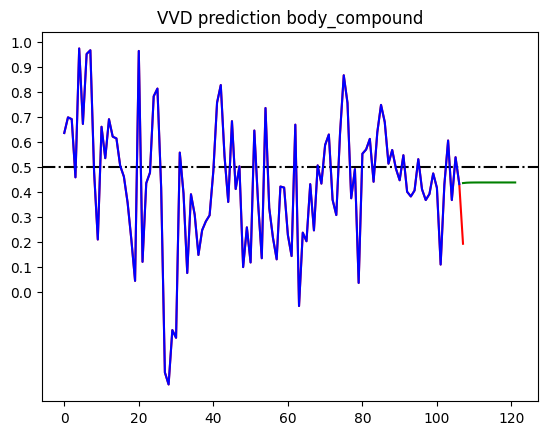

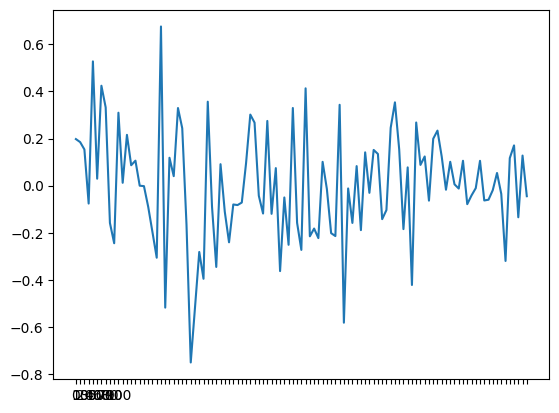

count    106.000000
mean      -0.000032
std        0.020015
min       -0.090033
25%       -0.008268
50%        0.002142
75%        0.011054
max        0.060327
dtype: float64


/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
/var/folders/9z/gq738z712wv0tz09r4b4vw6c0000gn/T/ipykernel_12835/3254081223.py:25: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_xticklabels(np.arange(0,len(party_sentiment[party_data]),10))


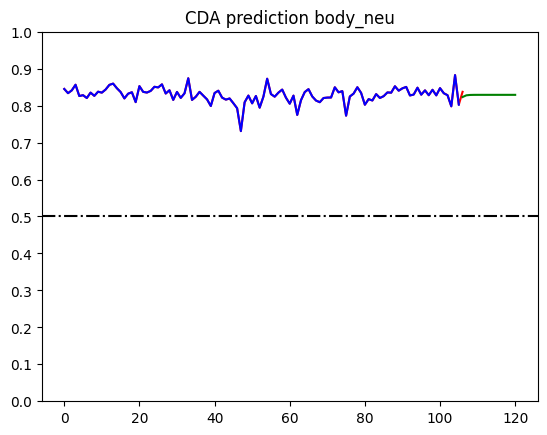

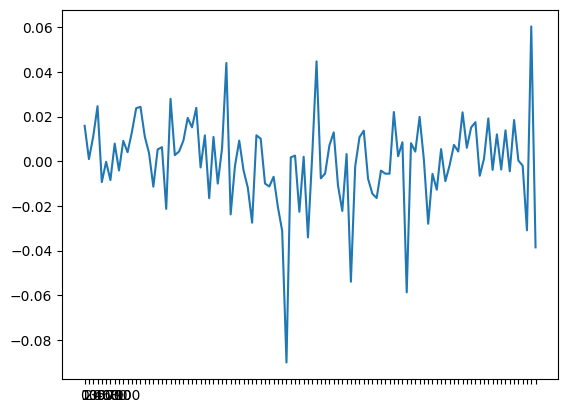

count    1.060000e+02
mean     3.327334e-12
std      1.186703e-02
min     -4.271983e-02
25%     -6.610458e-03
50%      7.518935e-04
75%      6.696834e-03
max      3.228017e-02
dtype: float64


/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
/var/folders/9z/gq738z712wv0tz09r4b4vw6c0000gn/T/ipykernel_12835/3254081223.py:25: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_xticklabels(np.arange(0,len(party_sentiment[party_data]),10))


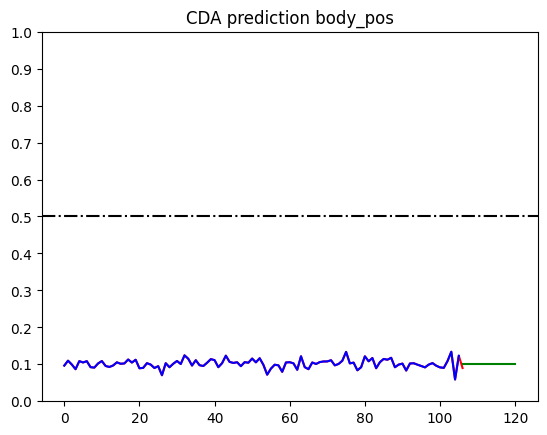

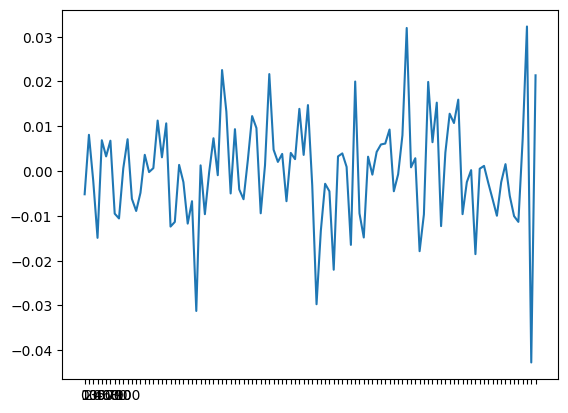

count    106.000000
mean       0.000114
std        0.016981
min       -0.053182
25%       -0.009503
50%       -0.001311
75%        0.006820
max        0.096244
dtype: float64


/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
/var/folders/9z/gq738z712wv0tz09r4b4vw6c0000gn/T/ipykernel_12835/3254081223.py:25: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_xticklabels(np.arange(0,len(party_sentiment[party_data]),10))


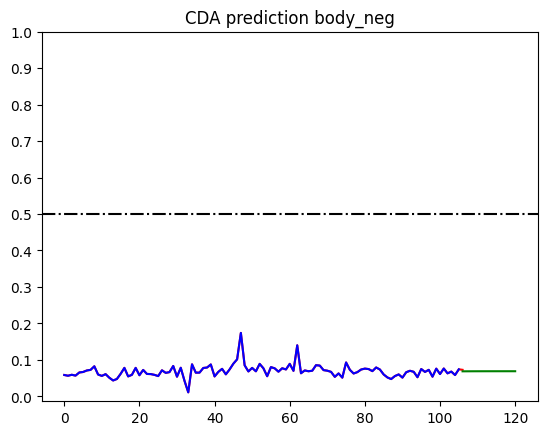

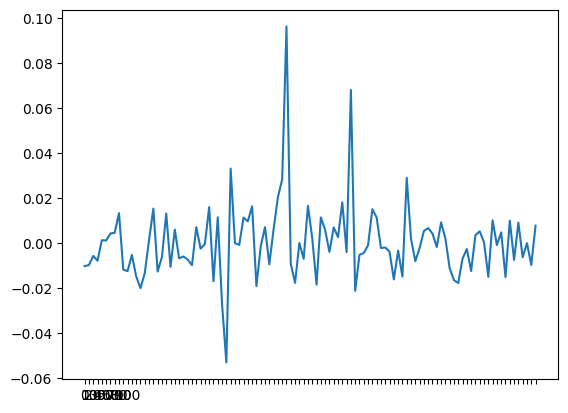

count    1.060000e+02
mean    -3.980045e-17
std      2.674796e-01
min     -1.437995e+00
25%     -1.385221e-01
50%      2.608982e-02
75%      1.612657e-01
max      5.577046e-01
dtype: float64


/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
/var/folders/9z/gq738z712wv0tz09r4b4vw6c0000gn/T/ipykernel_12835/3254081223.py:25: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_xticklabels(np.arange(0,len(party_sentiment[party_data]),10))


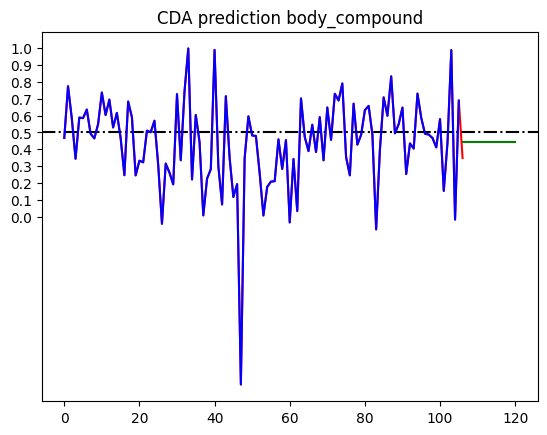

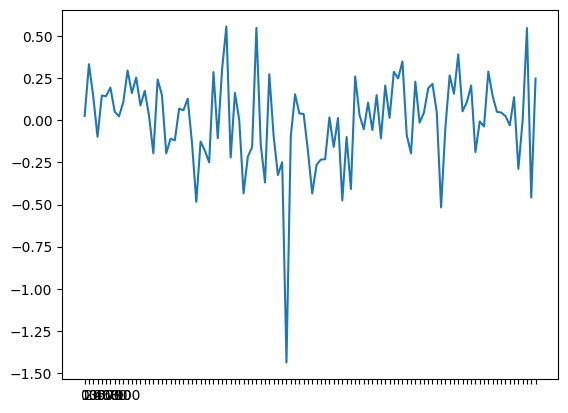

count    1.040000e+02
mean     1.656182e-12
std      2.446546e-02
min     -8.595119e-02
25%     -1.378705e-02
50%     -2.797778e-03
75%      1.037250e-02
max      1.140488e-01
dtype: float64


/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
/var/folders/9z/gq738z712wv0tz09r4b4vw6c0000gn/T/ipykernel_12835/3254081223.py:25: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_xticklabels(np.arange(0,len(party_sentiment[party_data]),10))


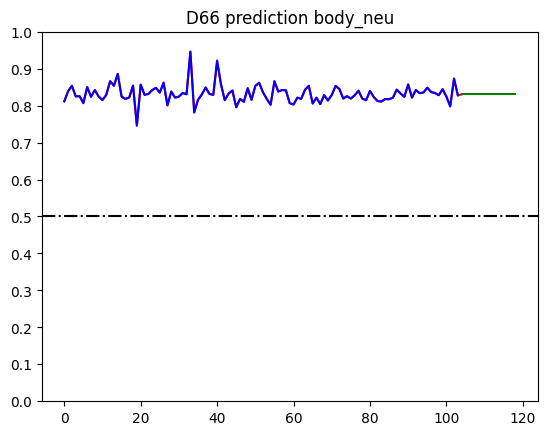

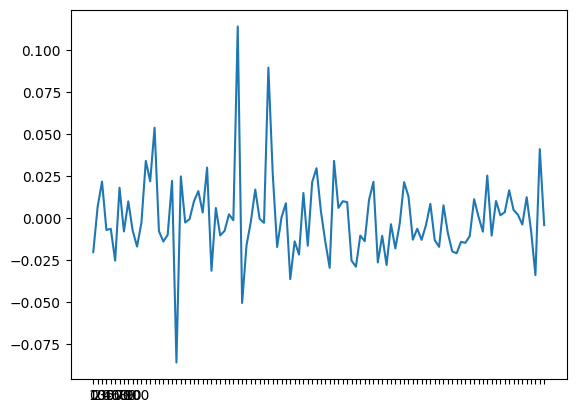

count    1.040000e+02
mean     1.234322e-17
std      1.565326e-02
min     -6.615509e-02
25%     -7.108661e-03
50%      3.007923e-04
75%      7.928243e-03
max      3.596991e-02
dtype: float64


/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
/var/folders/9z/gq738z712wv0tz09r4b4vw6c0000gn/T/ipykernel_12835/3254081223.py:25: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_xticklabels(np.arange(0,len(party_sentiment[party_data]),10))


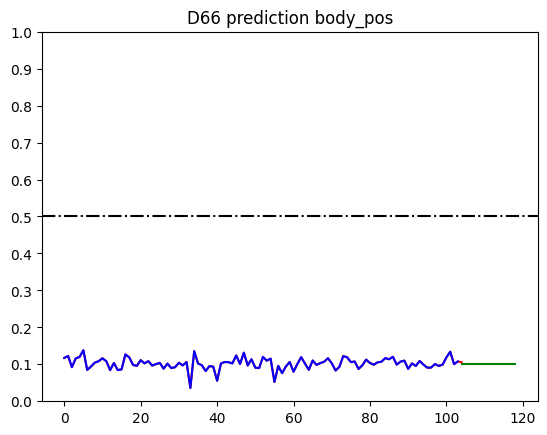

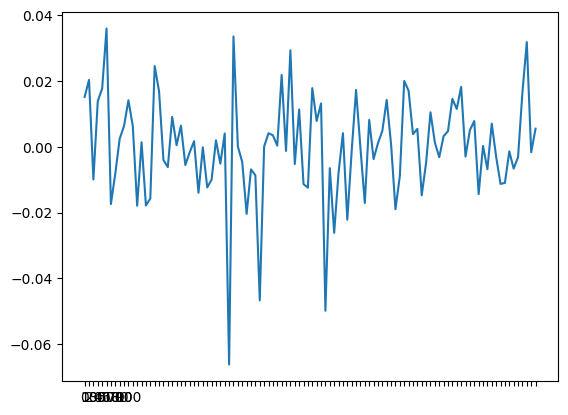

count    1.040000e+02
mean     4.444911e-13
std      1.791288e-02
min     -4.691494e-02
25%     -9.343509e-03
50%     -1.059382e-03
75%      9.412793e-03
max      9.208506e-02
dtype: float64


/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
/var/folders/9z/gq738z712wv0tz09r4b4vw6c0000gn/T/ipykernel_12835/3254081223.py:25: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_xticklabels(np.arange(0,len(party_sentiment[party_data]),10))


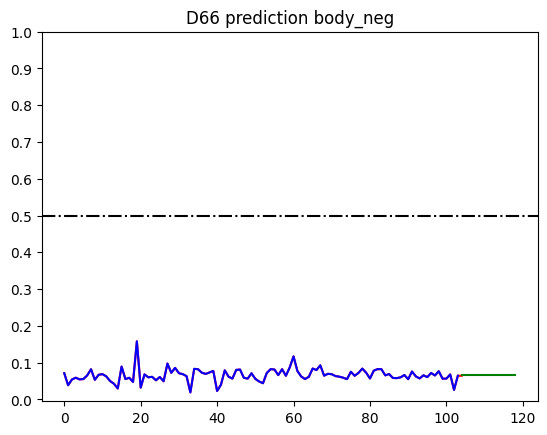

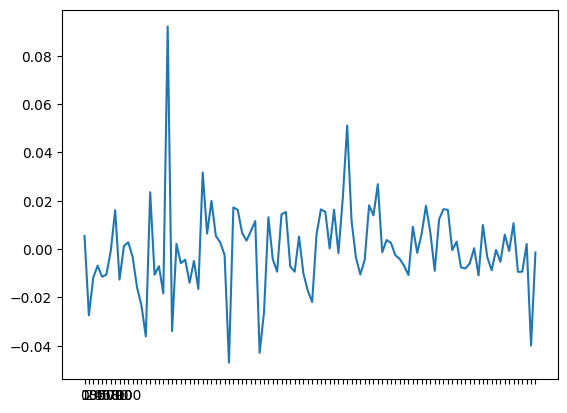

count    104.000000
mean      -0.000539
std        0.341245
min       -1.434308
25%       -0.145301
50%        0.063430
75%        0.175006
max        0.727576
dtype: float64


/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
/var/folders/9z/gq738z712wv0tz09r4b4vw6c0000gn/T/ipykernel_12835/3254081223.py:25: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_xticklabels(np.arange(0,len(party_sentiment[party_data]),10))


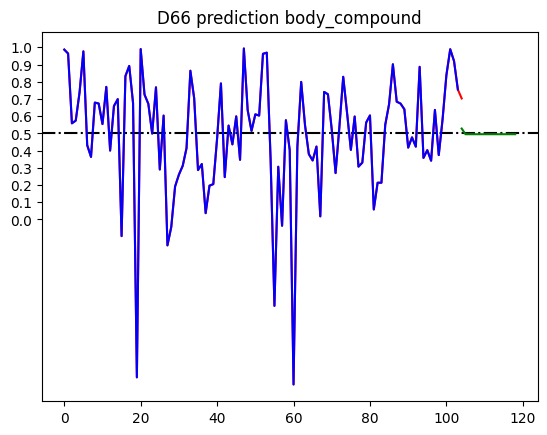

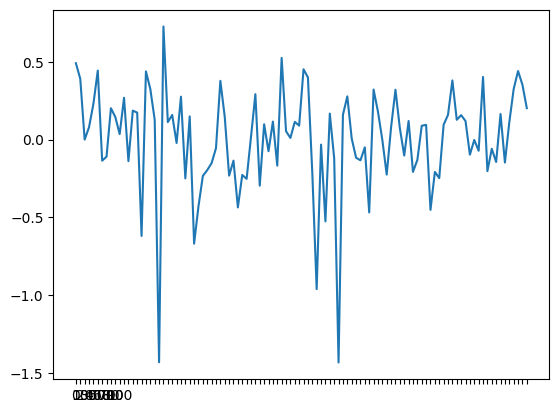

count    91.000000
mean      0.010295
std       0.097157
min      -0.143154
25%      -0.013443
50%       0.005025
75%       0.027472
max       0.846065
dtype: float64


/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
/var/folders/9z/gq738z712wv0tz09r4b4vw6c0000gn/T/ipykernel_12835/3254081223.py:25: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_xticklabels(np.arange(0,len(party_sentiment[party_data]),10))


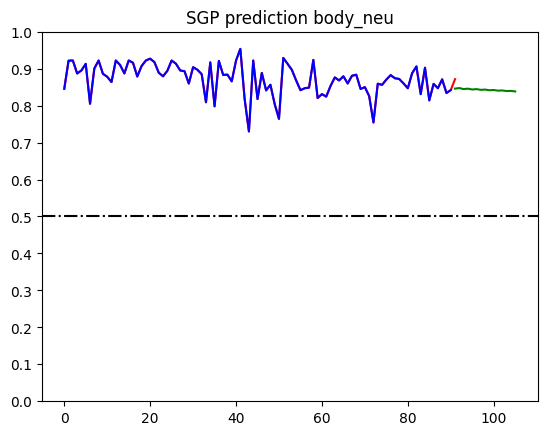

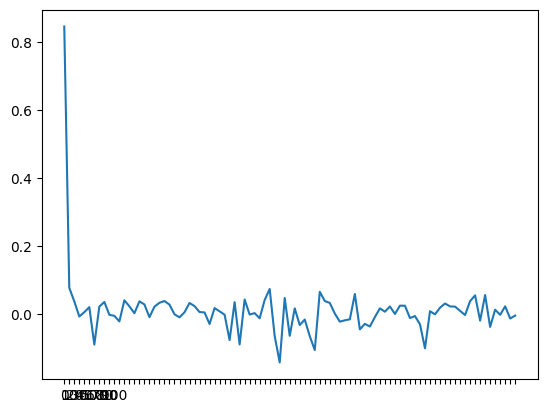

count    91.000000
mean      0.000179
std       0.026247
min      -0.049007
25%      -0.018155
50%      -0.006006
75%       0.014881
max       0.094666
dtype: float64


/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
/var/folders/9z/gq738z712wv0tz09r4b4vw6c0000gn/T/ipykernel_12835/3254081223.py:25: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_xticklabels(np.arange(0,len(party_sentiment[party_data]),10))


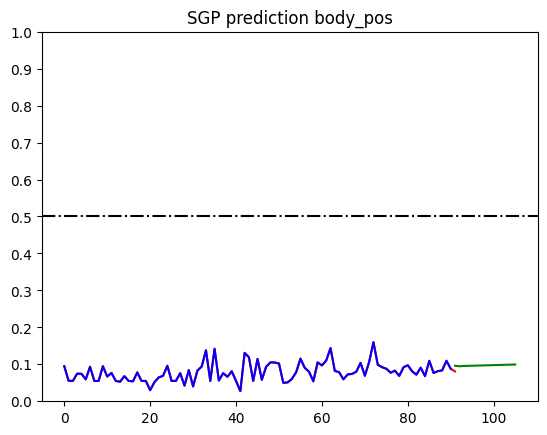

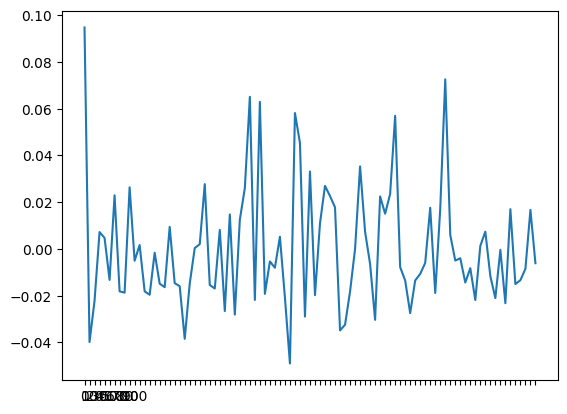

/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
/var/folders/9z/gq738z712wv0tz09r4b4vw6c0000gn/T/ipykernel_12835/3254081223.py:25: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_xticklabels(np.arange(0,len(party_sentiment[party_data]),10))


count    91.000000
mean      0.000237
std       0.024404
min      -0.047984
25%      -0.016534
50%      -0.001281
75%       0.011926
max       0.104172
dtype: float64


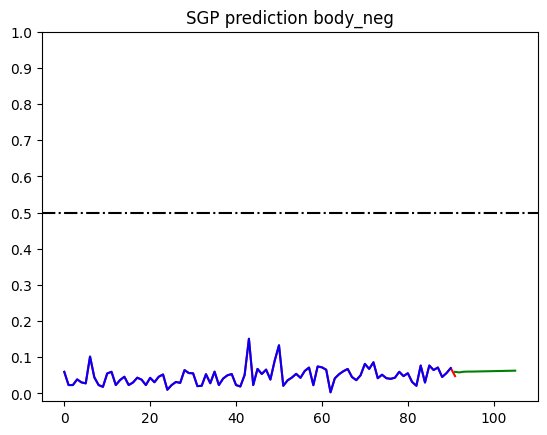

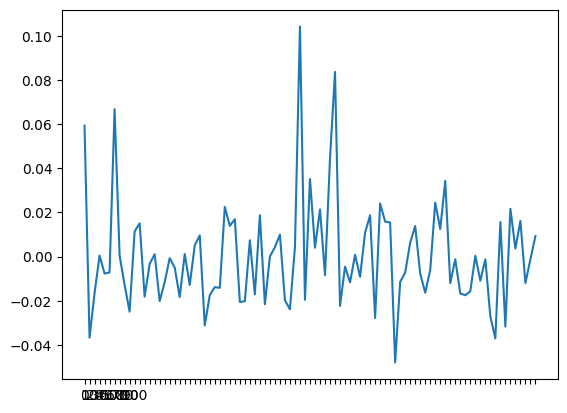

count    9.100000e+01
mean     3.096627e-10
std      4.154538e-01
min     -1.490022e+00
25%     -1.554734e-01
50%      6.897840e-02
75%      2.782034e-01
max      4.959784e-01
dtype: float64


/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
/var/folders/9z/gq738z712wv0tz09r4b4vw6c0000gn/T/ipykernel_12835/3254081223.py:25: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_xticklabels(np.arange(0,len(party_sentiment[party_data]),10))


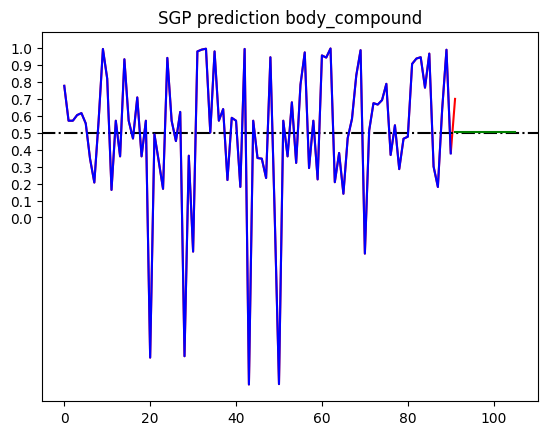

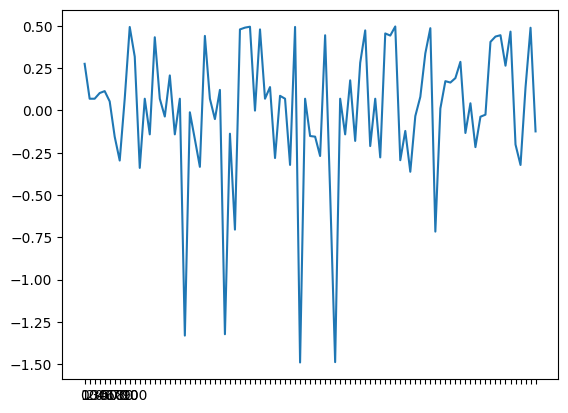

count    107.000000
mean       0.000044
std        0.018738
min       -0.040335
25%       -0.012927
50%        0.000079
75%        0.009923
max        0.060604
dtype: float64


/var/folders/9z/gq738z712wv0tz09r4b4vw6c0000gn/T/ipykernel_12835/3254081223.py:25: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_xticklabels(np.arange(0,len(party_sentiment[party_data]),10))


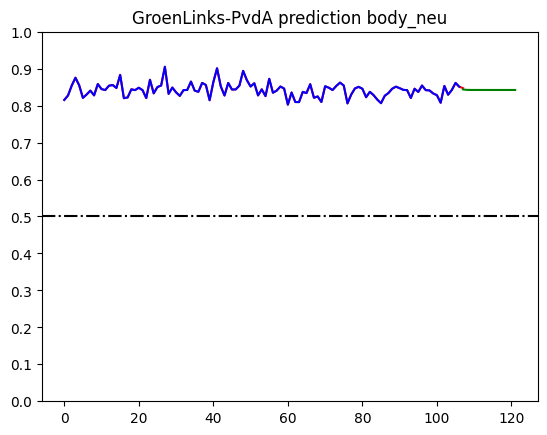

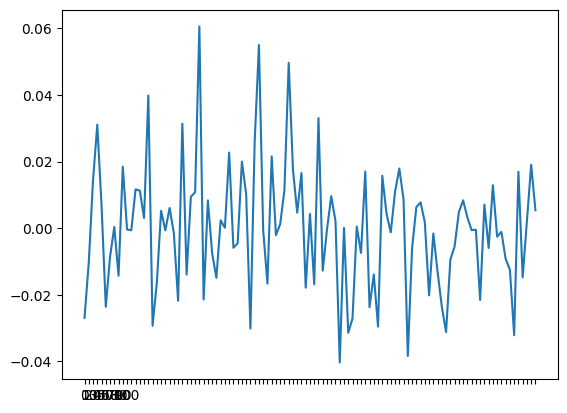

count    107.000000
mean       0.001334
std        0.016244
min       -0.040897
25%       -0.006528
50%        0.000343
75%        0.009408
max        0.098167
dtype: float64


/var/folders/9z/gq738z712wv0tz09r4b4vw6c0000gn/T/ipykernel_12835/3254081223.py:25: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_xticklabels(np.arange(0,len(party_sentiment[party_data]),10))


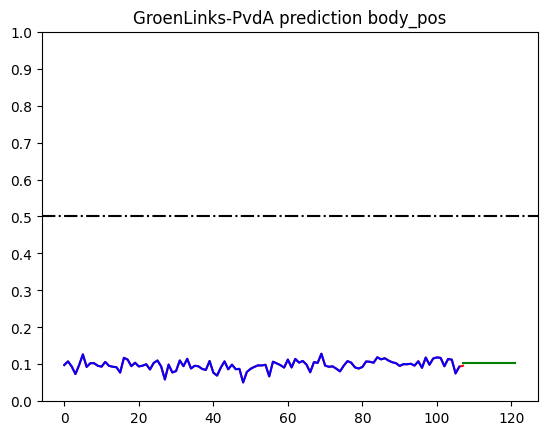

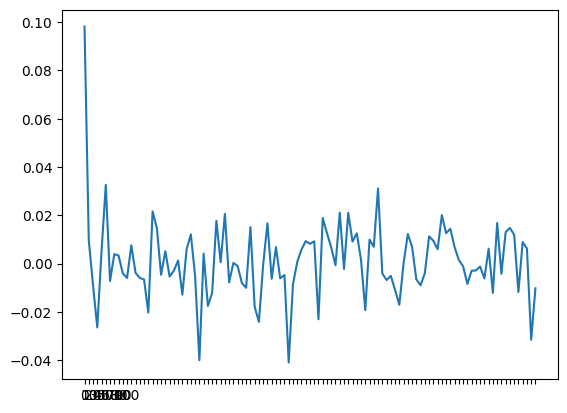

count    1.070000e+02
mean     3.792464e-13
std      1.118705e-02
min     -3.035032e-02
25%     -7.766990e-03
50%     -1.350324e-03
75%      5.193426e-03
max      2.664968e-02
dtype: float64


/var/folders/9z/gq738z712wv0tz09r4b4vw6c0000gn/T/ipykernel_12835/3254081223.py:25: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_xticklabels(np.arange(0,len(party_sentiment[party_data]),10))


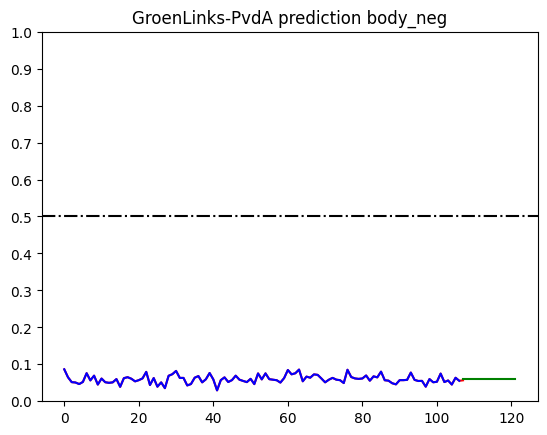

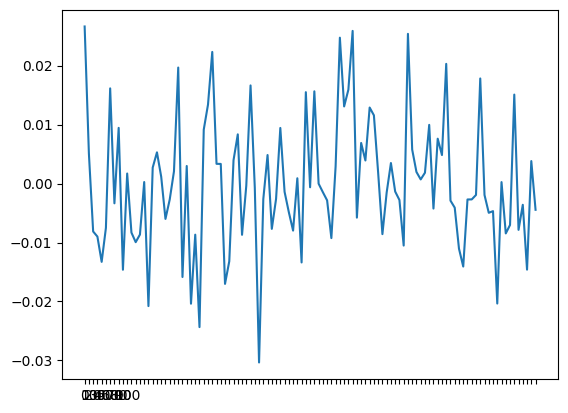

count    107.000000
mean       0.001406
std        0.201209
min       -0.704189
25%       -0.110550
50%        0.018761
75%        0.122782
max        0.453409
dtype: float64


/var/folders/9z/gq738z712wv0tz09r4b4vw6c0000gn/T/ipykernel_12835/3254081223.py:25: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_xticklabels(np.arange(0,len(party_sentiment[party_data]),10))


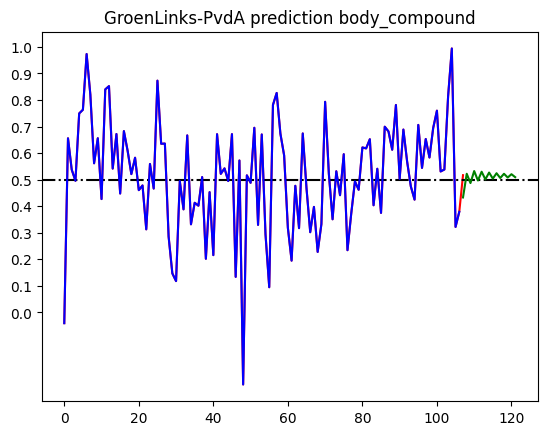

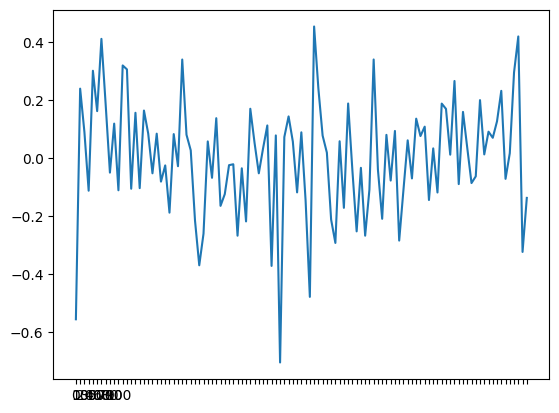

count    1.020000e+02
mean     7.166553e-12
std      2.609637e-02
min     -6.706853e-02
25%     -1.476853e-02
50%     -1.993532e-03
75%      1.305647e-02
max      8.518147e-02
dtype: float64


/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
/var/folders/9z/gq738z712wv0tz09r4b4vw6c0000gn/T/ipykernel_12835/3254081223.py:25: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_xticklabels(np.arange(0,len(party_sentiment[party_data]),10))


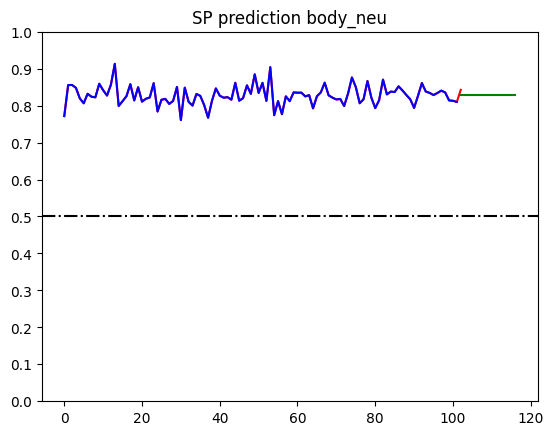

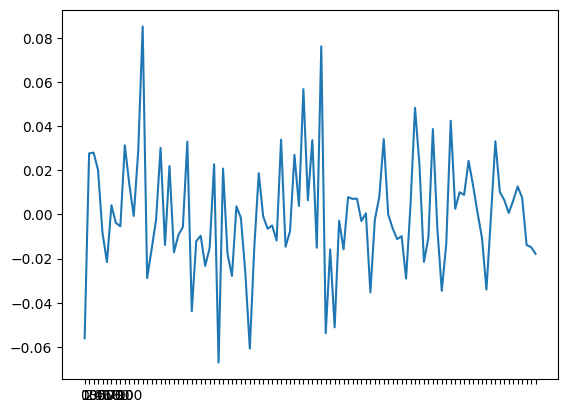

count    1.020000e+02
mean     4.401422e-12
std      1.917670e-02
min     -6.810955e-02
25%     -1.077621e-02
50%      3.404529e-04
75%      1.225504e-02
max      4.789045e-02
dtype: float64


/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
/var/folders/9z/gq738z712wv0tz09r4b4vw6c0000gn/T/ipykernel_12835/3254081223.py:25: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_xticklabels(np.arange(0,len(party_sentiment[party_data]),10))


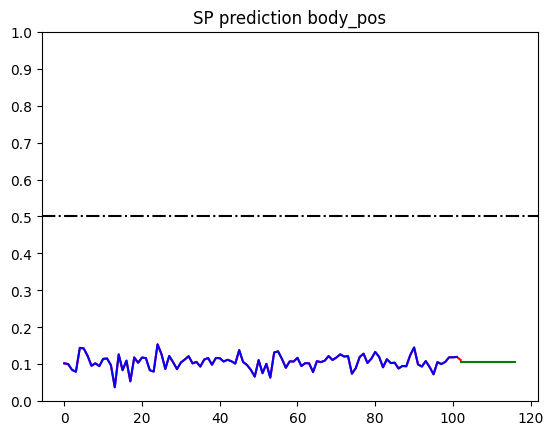

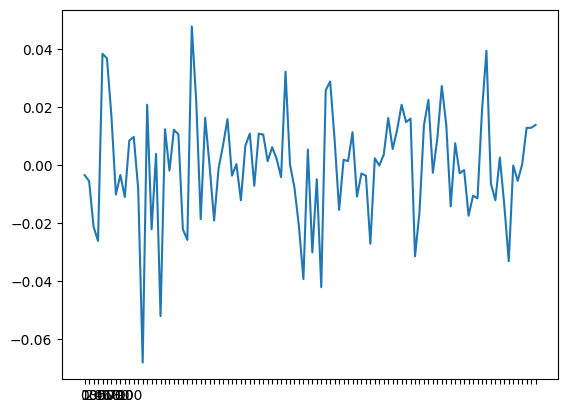

count    1.020000e+02
mean     4.041642e-12
std      2.054491e-02
min     -3.807241e-02
25%     -1.255157e-02
50%     -2.905741e-03
75%      7.927592e-03
max      6.842759e-02
dtype: float64


/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
/var/folders/9z/gq738z712wv0tz09r4b4vw6c0000gn/T/ipykernel_12835/3254081223.py:25: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_xticklabels(np.arange(0,len(party_sentiment[party_data]),10))


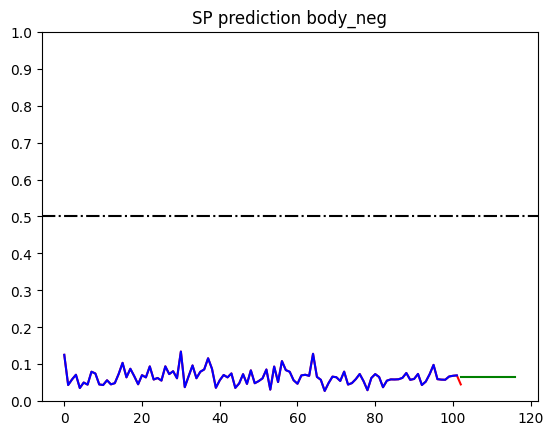

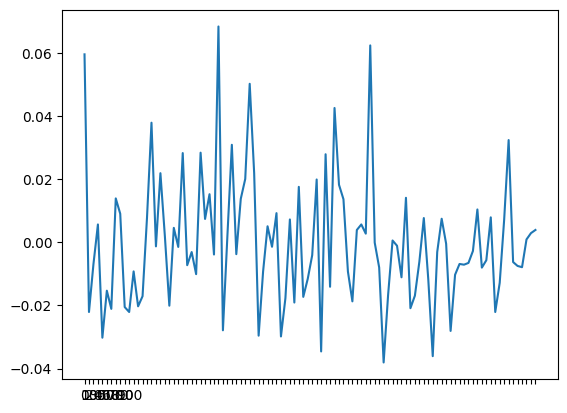

count    1.020000e+02
mean     2.637104e-10
std      4.538714e-01
min     -1.529978e+00
25%     -2.112685e-01
50%      8.403820e-02
75%      3.942840e-01
max      4.379215e-01
dtype: float64


/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
/var/folders/9z/gq738z712wv0tz09r4b4vw6c0000gn/T/ipykernel_12835/3254081223.py:25: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_xticklabels(np.arange(0,len(party_sentiment[party_data]),10))


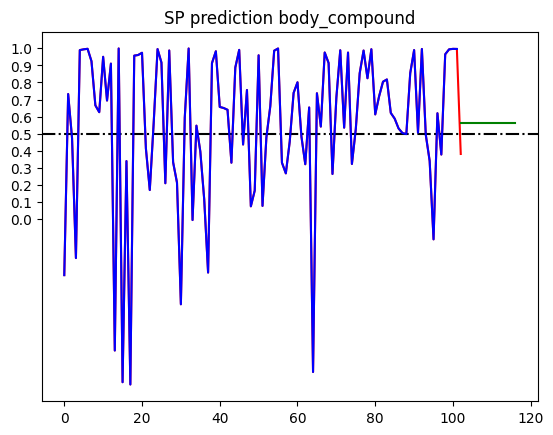

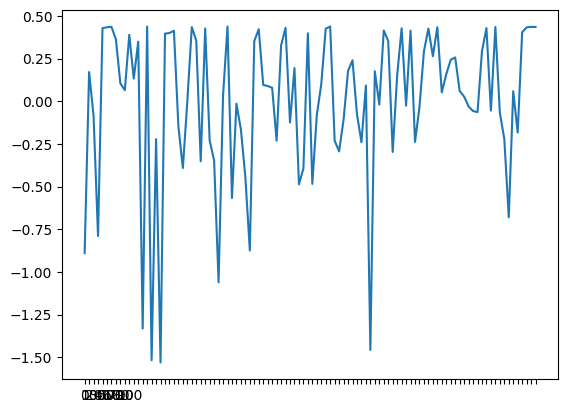

count    9.100000e+01
mean     5.042828e-13
std      4.173569e-02
min     -1.422456e-01
25%     -2.274564e-02
50%     -3.245644e-03
75%      2.644007e-02
max      9.525436e-02
dtype: float64


/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
/var/folders/9z/gq738z712wv0tz09r4b4vw6c0000gn/T/ipykernel_12835/3254081223.py:25: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_xticklabels(np.arange(0,len(party_sentiment[party_data]),10))


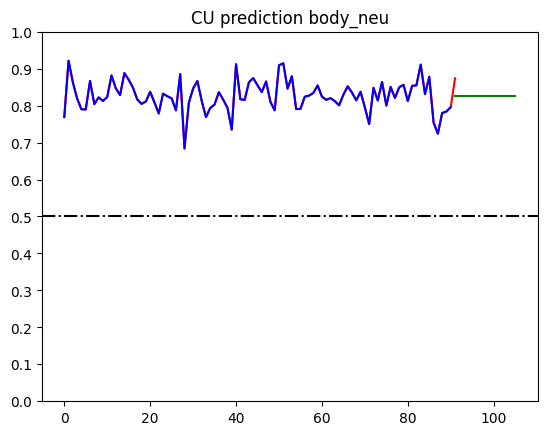

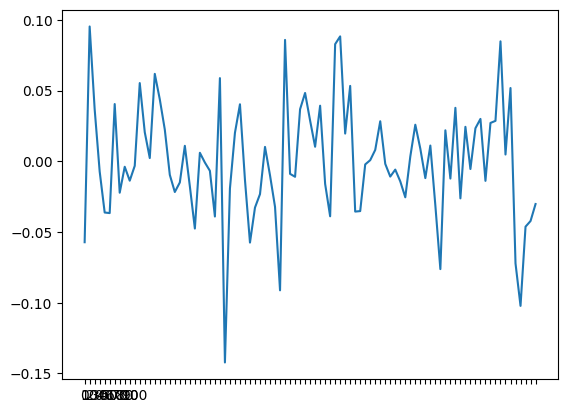

count    91.000000
mean     -0.000059
std       0.027656
min      -0.055384
25%      -0.014521
50%      -0.001855
75%       0.012461
max       0.116280
dtype: float64


/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
/var/folders/9z/gq738z712wv0tz09r4b4vw6c0000gn/T/ipykernel_12835/3254081223.py:25: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_xticklabels(np.arange(0,len(party_sentiment[party_data]),10))


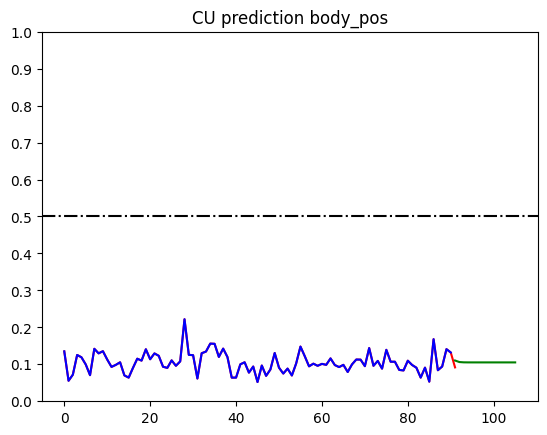

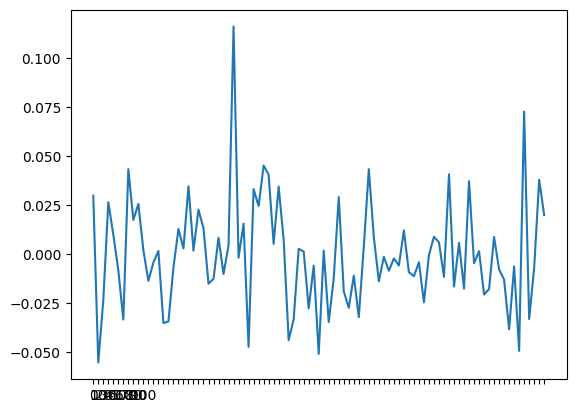

count    9.100000e+01
mean     7.896871e-12
std      3.090045e-02
min     -6.870895e-02
25%     -1.720895e-02
50%     -2.708953e-03
75%      1.208271e-02
max      1.317910e-01
dtype: float64


/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
/var/folders/9z/gq738z712wv0tz09r4b4vw6c0000gn/T/ipykernel_12835/3254081223.py:25: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_xticklabels(np.arange(0,len(party_sentiment[party_data]),10))


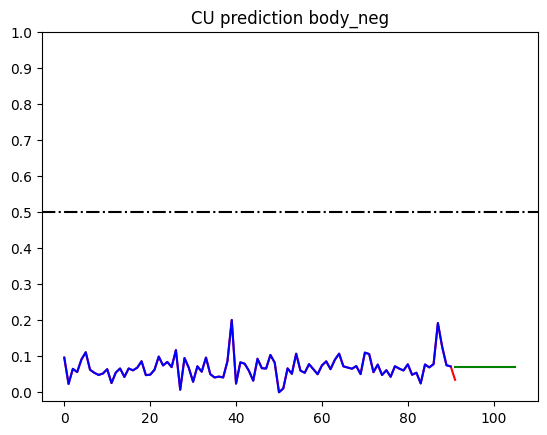

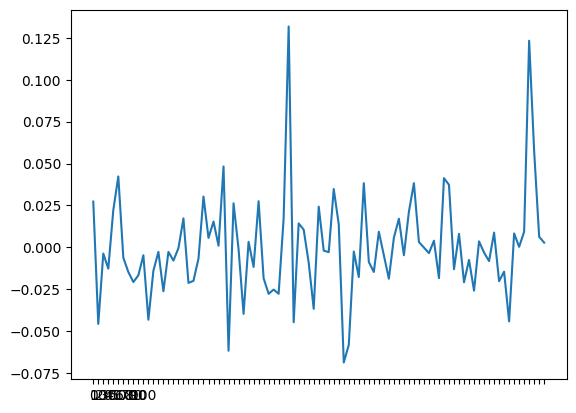

count    9.100000e+01
mean     1.772362e-09
std      5.408864e-01
min     -1.500670e+00
25%     -1.883105e-01
50%      1.055799e-01
75%      4.658549e-01
max      4.964299e-01
dtype: float64


/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
/var/folders/9z/gq738z712wv0tz09r4b4vw6c0000gn/T/ipykernel_12835/3254081223.py:25: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_xticklabels(np.arange(0,len(party_sentiment[party_data]),10))


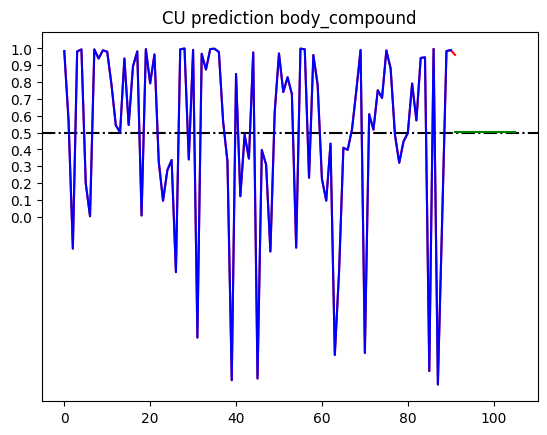

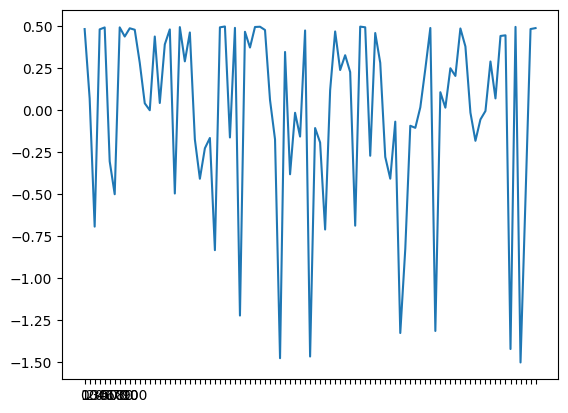

count    8.900000e+01
mean     7.841006e-12
std      3.455847e-02
min     -1.116460e-01
25%     -1.564597e-02
50%      1.211174e-03
75%      2.135403e-02
max      1.293540e-01
dtype: float64


/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
/var/folders/9z/gq738z712wv0tz09r4b4vw6c0000gn/T/ipykernel_12835/3254081223.py:25: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_xticklabels(np.arange(0,len(party_sentiment[party_data]),10))


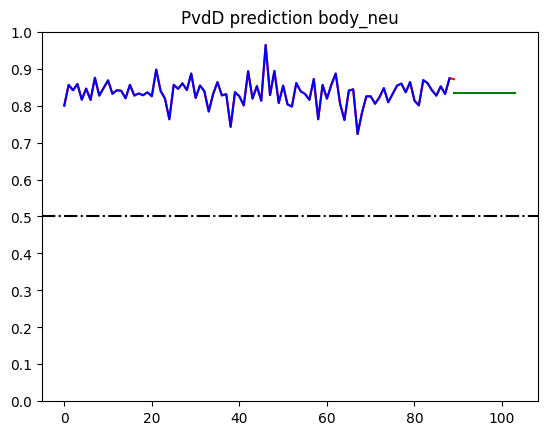

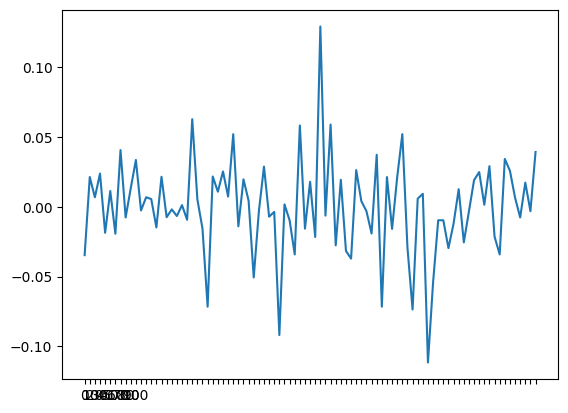

count    8.900000e+01
mean     2.731971e-11
std      2.793243e-02
min     -7.249287e-02
25%     -1.289287e-02
50%     -2.492870e-03
75%      1.800713e-02
max      7.884046e-02
dtype: float64


/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
/var/folders/9z/gq738z712wv0tz09r4b4vw6c0000gn/T/ipykernel_12835/3254081223.py:25: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_xticklabels(np.arange(0,len(party_sentiment[party_data]),10))


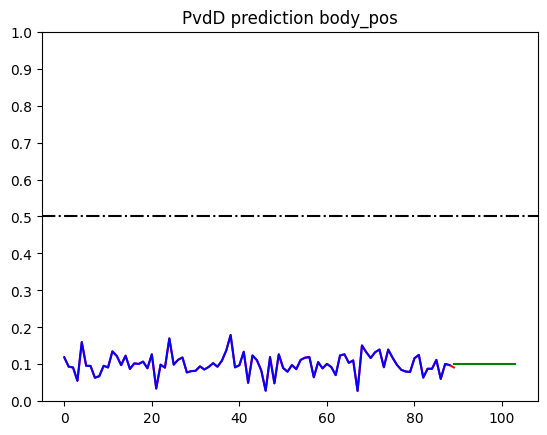

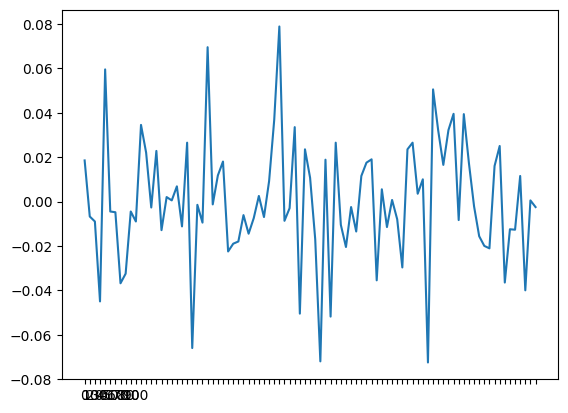

count    8.900000e+01
mean     3.735485e-11
std      2.957168e-02
min     -5.687346e-02
25%     -1.387346e-02
50%     -4.206793e-03
75%      6.926540e-03
max      1.841265e-01
dtype: float64


/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
/var/folders/9z/gq738z712wv0tz09r4b4vw6c0000gn/T/ipykernel_12835/3254081223.py:25: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_xticklabels(np.arange(0,len(party_sentiment[party_data]),10))


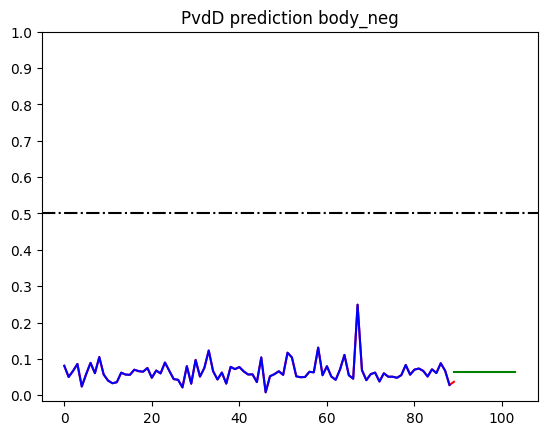

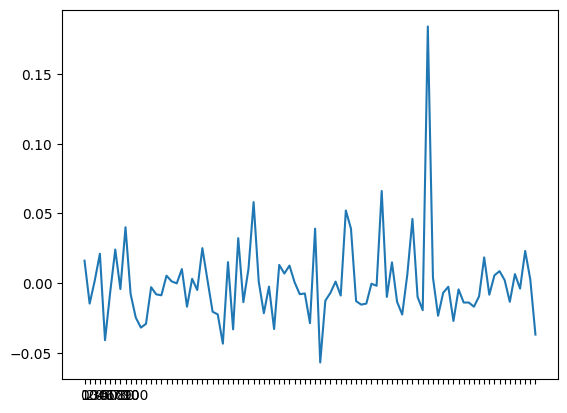

count    8.900000e+01
mean     1.244556e-09
std      5.994794e-01
min     -1.456565e+00
25%     -2.555651e-01
50%      1.453949e-01
75%      5.027849e-01
max      5.398349e-01
dtype: float64


/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
/var/folders/9z/gq738z712wv0tz09r4b4vw6c0000gn/T/ipykernel_12835/3254081223.py:25: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_xticklabels(np.arange(0,len(party_sentiment[party_data]),10))


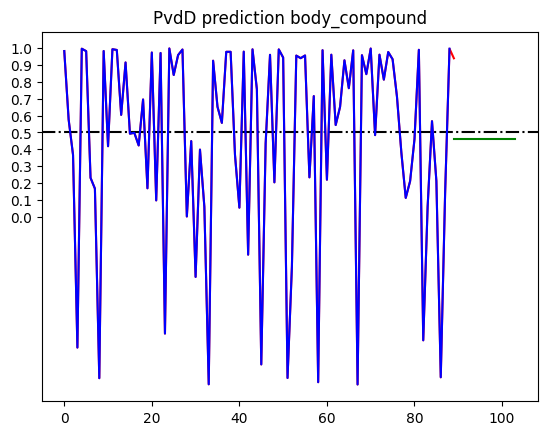

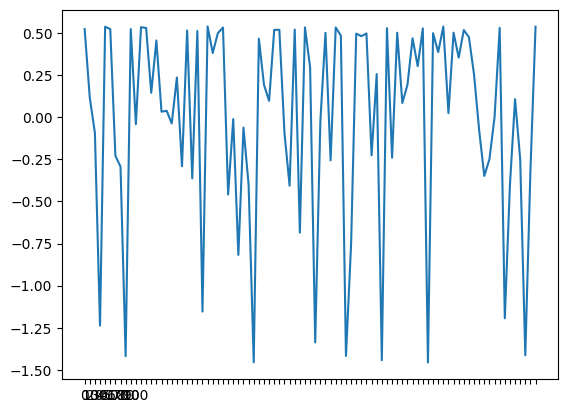

count    1.030000e+02
mean     2.733353e-11
std      2.993731e-02
min     -9.912436e-02
25%     -1.363208e-02
50%     -3.440152e-03
75%      1.459155e-02
max      7.387564e-02
dtype: float64


/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
/var/folders/9z/gq738z712wv0tz09r4b4vw6c0000gn/T/ipykernel_12835/3254081223.py:25: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_xticklabels(np.arange(0,len(party_sentiment[party_data]),10))


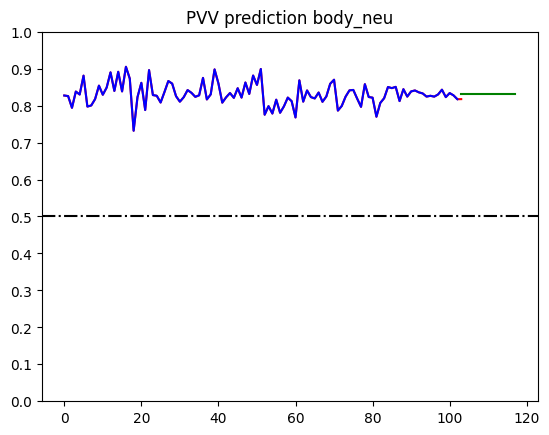

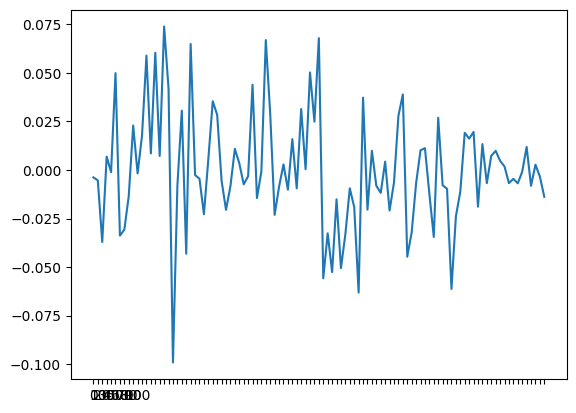

count    1.030000e+02
mean     1.656634e-12
std      2.335429e-02
min     -8.178733e-02
25%     -1.138051e-02
50%      1.120569e-03
75%      1.318490e-02
max      7.121267e-02
dtype: float64


/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
/var/folders/9z/gq738z712wv0tz09r4b4vw6c0000gn/T/ipykernel_12835/3254081223.py:25: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_xticklabels(np.arange(0,len(party_sentiment[party_data]),10))


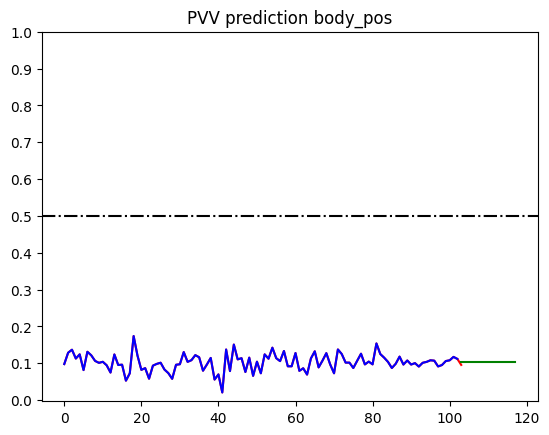

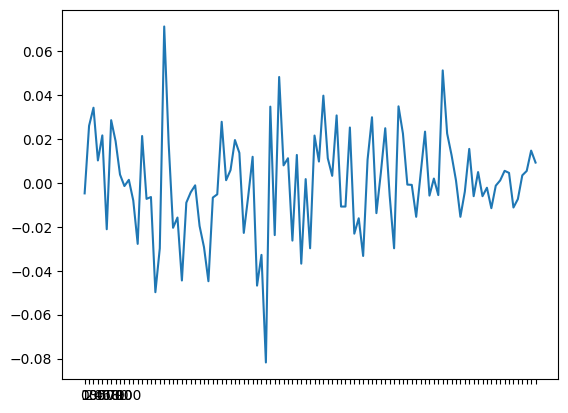

/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
/var/folders/9z/gq738z712wv0tz09r4b4vw6c0000gn/T/ipykernel_12835/3254081223.py:25: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_xticklabels(np.arange(0,len(party_sentiment[party_data]),10))


count    1.030000e+02
mean     5.715174e-12
std      2.160408e-02
min     -5.261506e-02
25%     -1.303172e-02
50%     -7.817234e-04
75%      9.910917e-03
max      1.058849e-01
dtype: float64


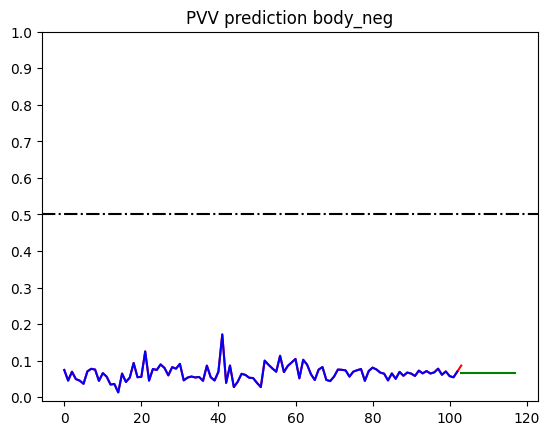

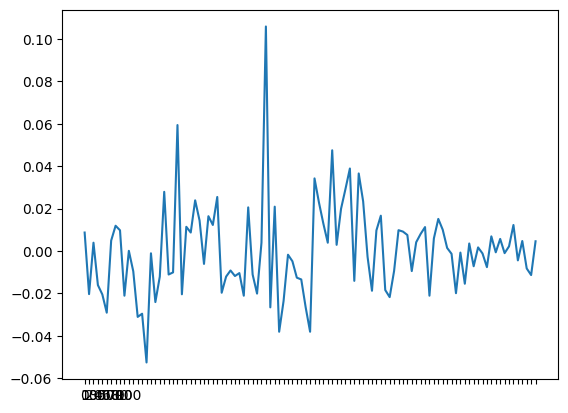

/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
/var/folders/9z/gq738z712wv0tz09r4b4vw6c0000gn/T/ipykernel_12835/3254081223.py:25: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_xticklabels(np.arange(0,len(party_sentiment[party_data]),10))


count    1.030000e+02
mean     6.245342e-10
std      4.281165e-01
min     -1.522605e+00
25%     -2.000380e-01
50%      6.547530e-02
75%      3.680370e-01
max      4.746953e-01
dtype: float64


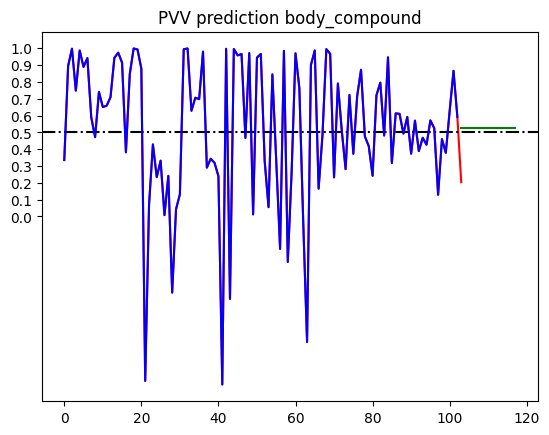

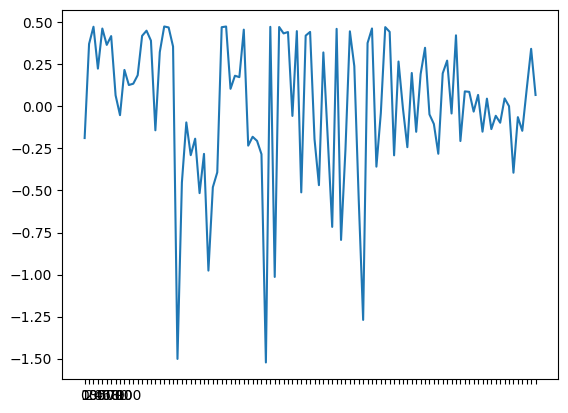

count    2.900000e+01
mean     1.084441e-11
std      3.433440e-02
min     -6.253736e-02
25%     -2.153736e-02
50%      2.462644e-03
75%      2.046264e-02
max      7.146264e-02
dtype: float64


/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
/var/folders/9z/gq738z712wv0tz09r4b4vw6c0000gn/T/ipykernel_12835/3254081223.py:25: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_xticklabels(np.arange(0,len(party_sentiment[party_data]),10))


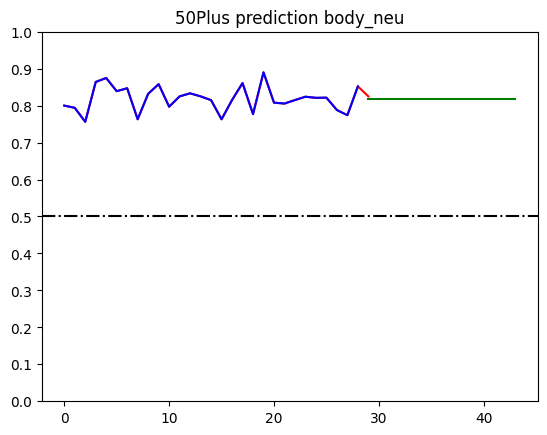

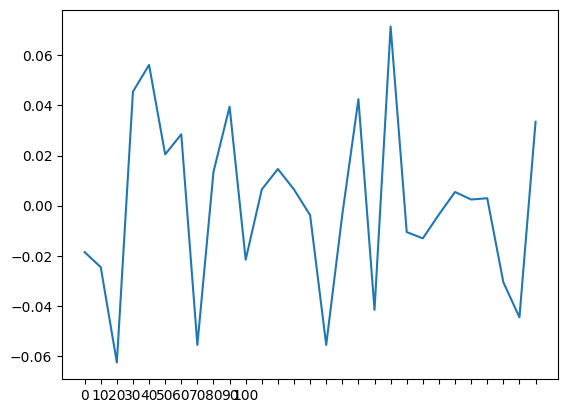

count    2.900000e+01
mean     1.192093e-11
std      3.569027e-02
min     -5.801149e-02
25%     -2.851149e-02
50%     -5.114942e-04
75%      1.798851e-02
max      8.698851e-02
dtype: float64


/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
/var/folders/9z/gq738z712wv0tz09r4b4vw6c0000gn/T/ipykernel_12835/3254081223.py:25: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_xticklabels(np.arange(0,len(party_sentiment[party_data]),10))


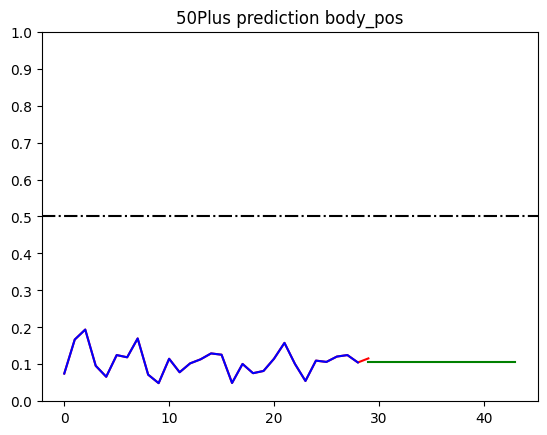

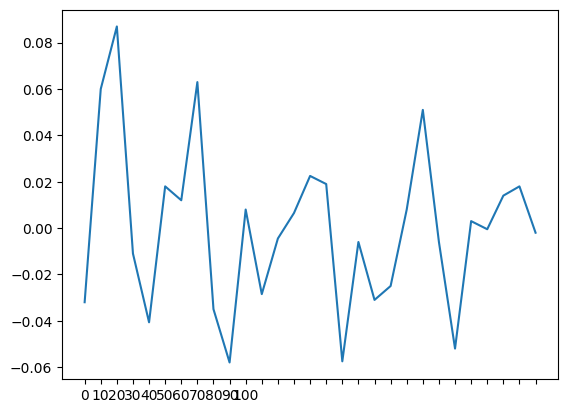

count    2.900000e+01
mean     2.551605e-11
std      3.303917e-02
min     -4.650000e-02
25%     -3.150000e-02
50%     -5.500000e-03
75%      2.150000e-02
max      7.250000e-02
dtype: float64


/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
/var/folders/9z/gq738z712wv0tz09r4b4vw6c0000gn/T/ipykernel_12835/3254081223.py:25: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_xticklabels(np.arange(0,len(party_sentiment[party_data]),10))


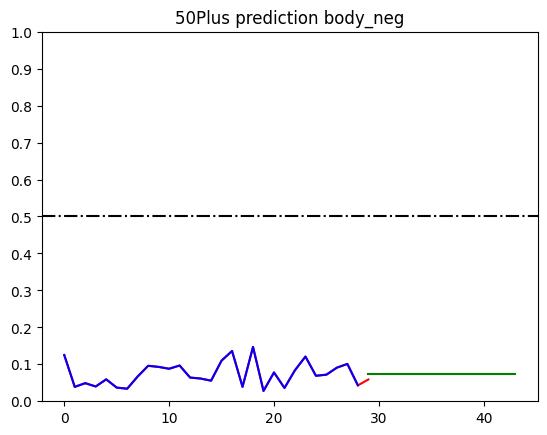

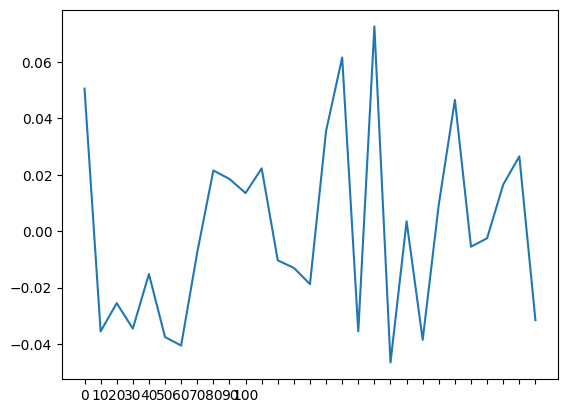

count    2.900000e+01
mean     2.214051e-09
std      7.822112e-01
min     -1.447065e+00
25%     -2.379986e-01
50%      4.852348e-01
75%      5.378848e-01
max      5.515348e-01
dtype: float64


/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
/var/folders/9z/gq738z712wv0tz09r4b4vw6c0000gn/T/ipykernel_12835/3254081223.py:25: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_xticklabels(np.arange(0,len(party_sentiment[party_data]),10))


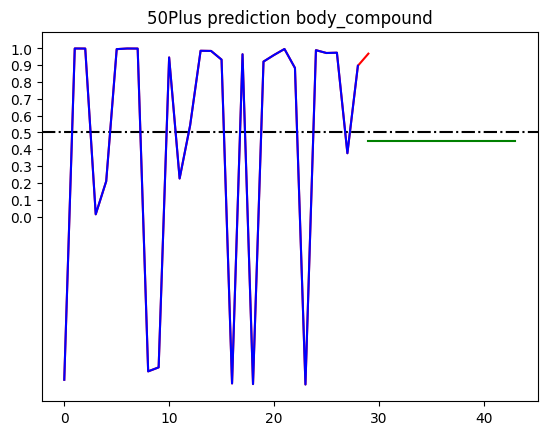

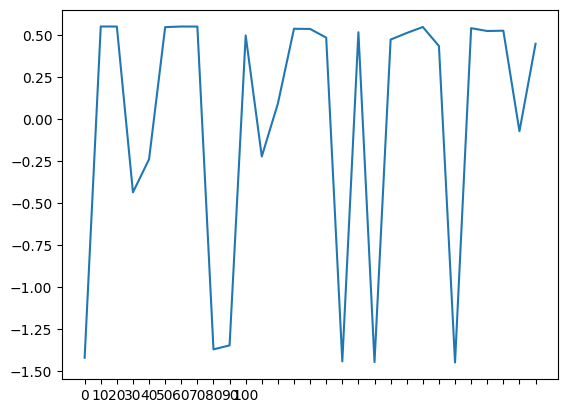

count    1.020000e+02
mean     7.893421e-12
std      2.998728e-02
min     -8.249425e-02
25%     -1.586925e-02
50%     -6.609205e-04
75%      1.797797e-02
max      9.750575e-02
dtype: float64


/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
/var/folders/9z/gq738z712wv0tz09r4b4vw6c0000gn/T/ipykernel_12835/3254081223.py:25: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_xticklabels(np.arange(0,len(party_sentiment[party_data]),10))


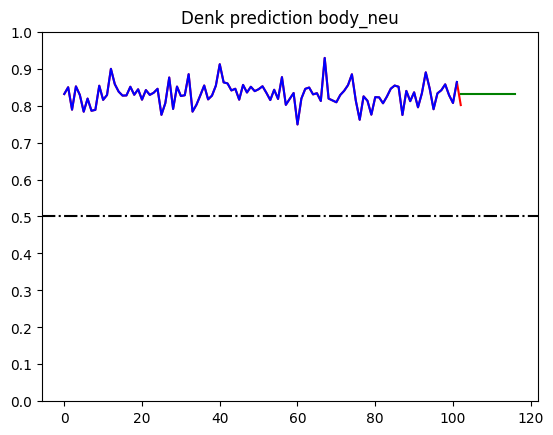

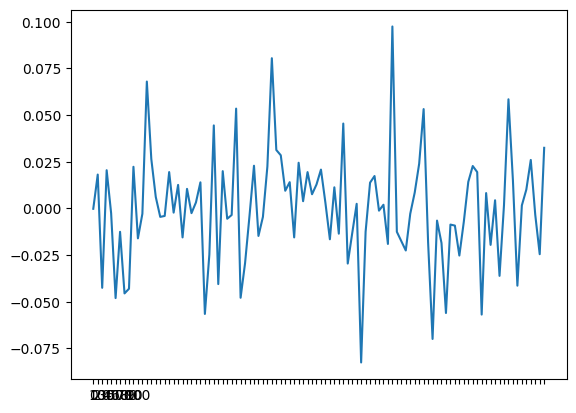

count    1.020000e+02
mean     2.597983e-12
std      2.188952e-02
min     -5.331142e-02
25%     -1.372809e-02
50%     -4.780890e-04
75%      1.473024e-02
max      6.668858e-02
dtype: float64


/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
/var/folders/9z/gq738z712wv0tz09r4b4vw6c0000gn/T/ipykernel_12835/3254081223.py:25: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_xticklabels(np.arange(0,len(party_sentiment[party_data]),10))


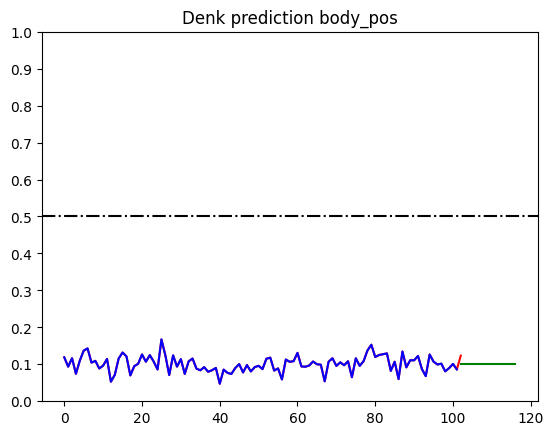

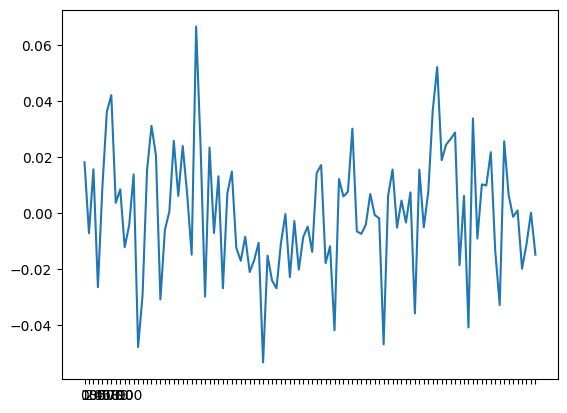

count    1.020000e+02
mean     1.497260e-12
std      2.119944e-02
min     -6.068503e-02
25%     -1.327878e-02
50%     -1.518363e-03
75%      1.358283e-02
max      7.471497e-02
dtype: float64


/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
/var/folders/9z/gq738z712wv0tz09r4b4vw6c0000gn/T/ipykernel_12835/3254081223.py:25: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_xticklabels(np.arange(0,len(party_sentiment[party_data]),10))


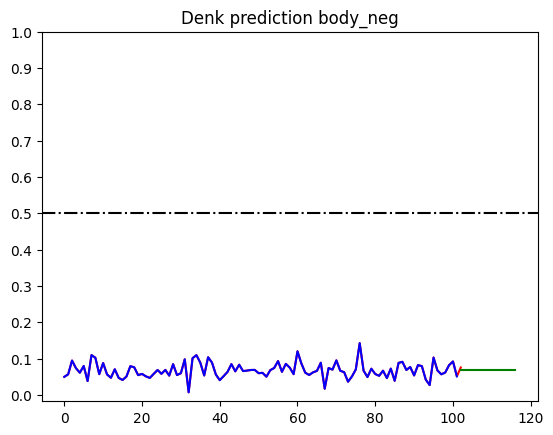

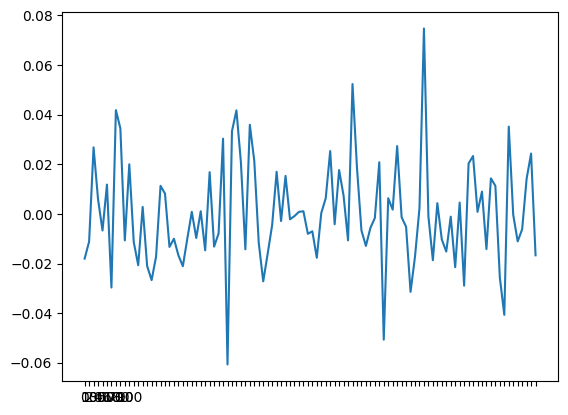

count    1.020000e+02
mean     2.177857e-10
std      4.615649e-01
min     -1.415558e+00
25%     -2.957227e-01
50%      4.281339e-02
75%      4.491671e-01
max      5.498421e-01
dtype: float64


/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
/var/folders/9z/gq738z712wv0tz09r4b4vw6c0000gn/T/ipykernel_12835/3254081223.py:25: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_xticklabels(np.arange(0,len(party_sentiment[party_data]),10))


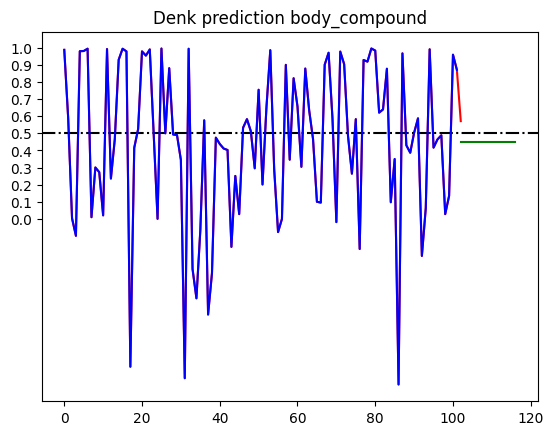

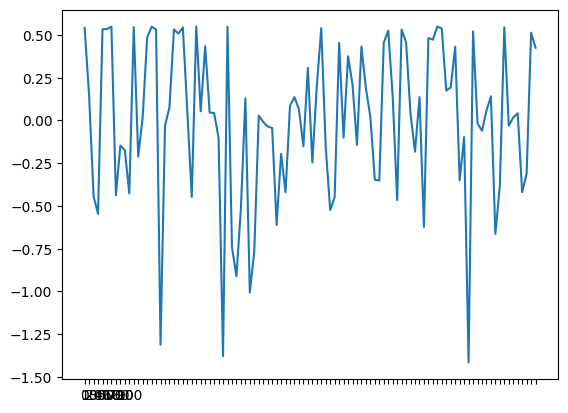

count    77.000000
mean     -0.001379
std       0.041659
min      -0.101405
25%      -0.026944
50%      -0.001271
75%       0.023963
max       0.123903
dtype: float64


/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
/var/folders/9z/gq738z712wv0tz09r4b4vw6c0000gn/T/ipykernel_12835/3254081223.py:25: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_xticklabels(np.arange(0,len(party_sentiment[party_data]),10))


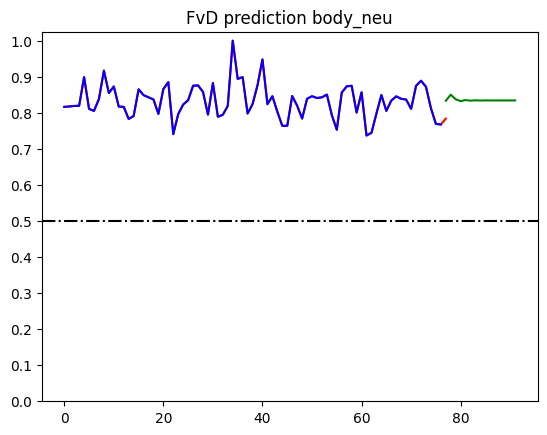

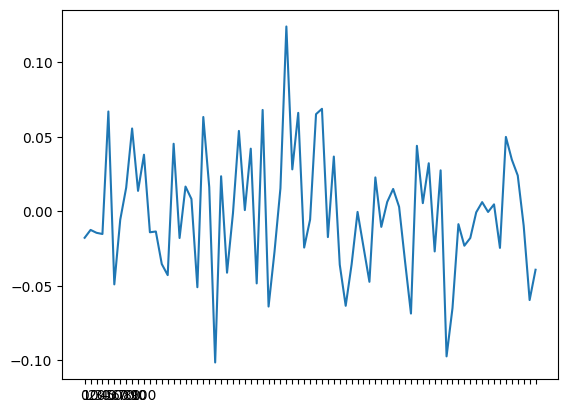

/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
/var/folders/9z/gq738z712wv0tz09r4b4vw6c0000gn/T/ipykernel_12835/3254081223.py:25: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_xticklabels(np.arange(0,len(party_sentiment[party_data]),10))


count    7.700000e+01
mean     9.414169e-12
std      3.092365e-02
min     -1.012232e-01
25%     -2.072319e-02
50%      1.576812e-03
75%      1.977681e-02
max      8.577681e-02
dtype: float64


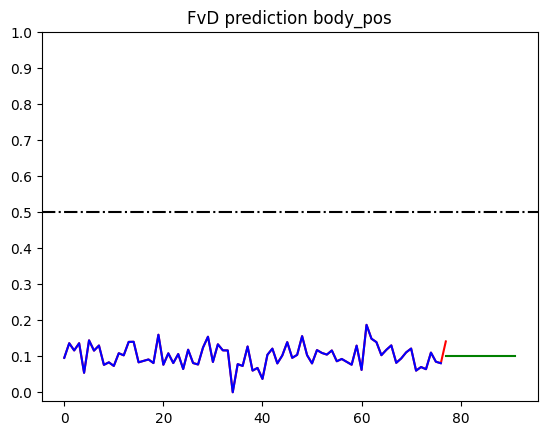

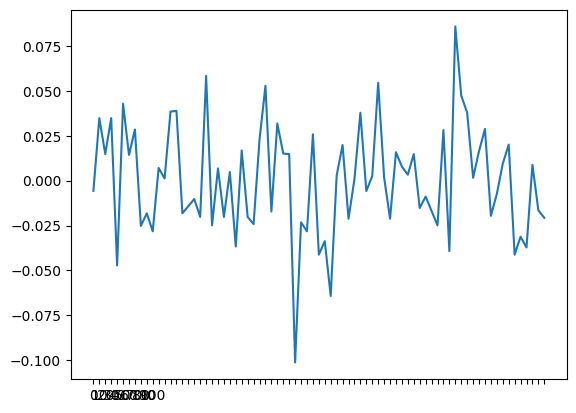

count    77.000000
mean     -0.000009
std       0.031178
min      -0.069008
25%      -0.017425
50%      -0.001521
75%       0.013626
max       0.123540
dtype: float64


/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
/var/folders/9z/gq738z712wv0tz09r4b4vw6c0000gn/T/ipykernel_12835/3254081223.py:25: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_xticklabels(np.arange(0,len(party_sentiment[party_data]),10))


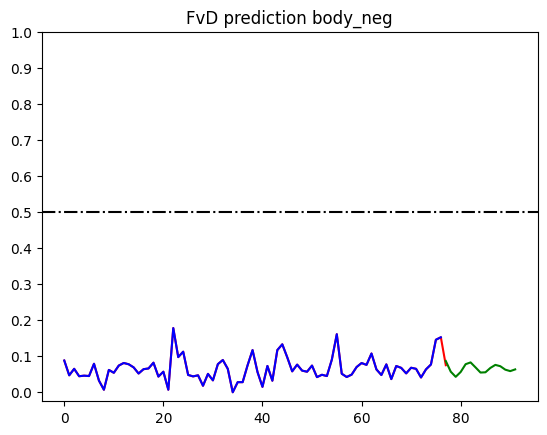

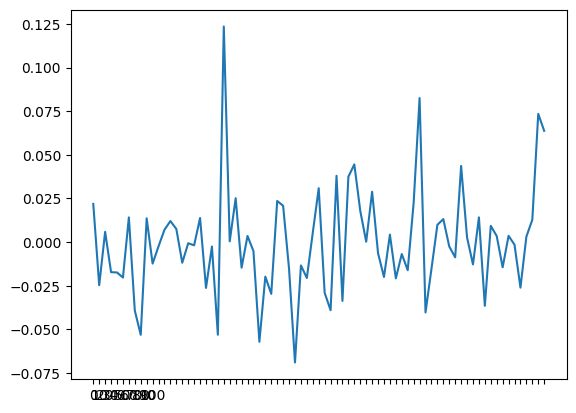

count    7.700000e+01
mean     6.977525e-10
std      6.246979e-01
min     -1.498914e+00
25%     -1.701809e-01
50%      1.863858e-01
75%      4.814358e-01
max      4.946858e-01
dtype: float64


/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
/var/folders/9z/gq738z712wv0tz09r4b4vw6c0000gn/T/ipykernel_12835/3254081223.py:25: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_xticklabels(np.arange(0,len(party_sentiment[party_data]),10))


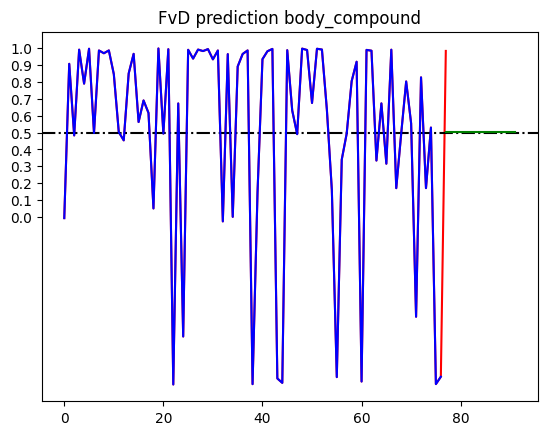

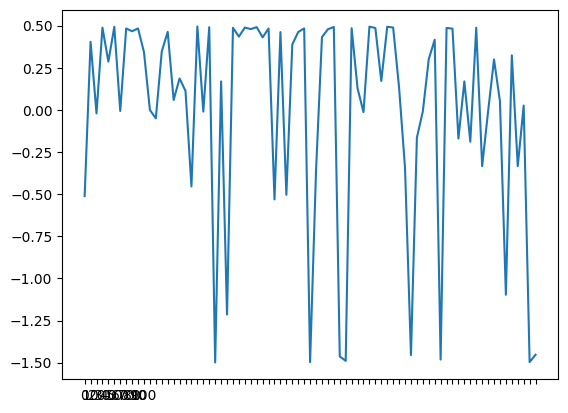

count    36.000000
mean     -0.005437
std       0.055050
min      -0.157441
25%      -0.026352
50%      -0.002511
75%       0.025950
max       0.163234
dtype: float64


/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
/var/folders/9z/gq738z712wv0tz09r4b4vw6c0000gn/T/ipykernel_12835/3254081223.py:25: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_xticklabels(np.arange(0,len(party_sentiment[party_data]),10))


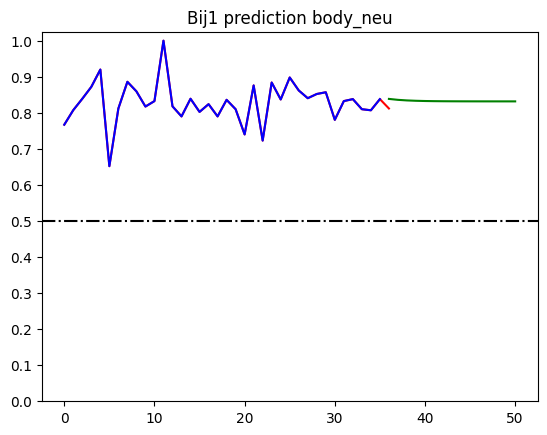

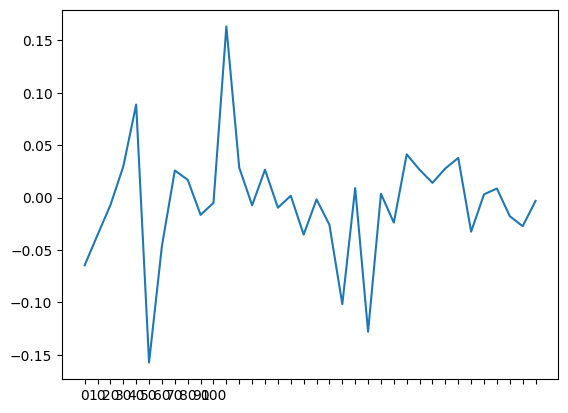

count    3.600000e+01
mean     7.029413e-12
std      4.173896e-02
min     -1.010023e-01
25%     -2.500231e-02
50%      4.497685e-03
75%      3.024769e-02
max      9.599769e-02
dtype: float64


/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
/var/folders/9z/gq738z712wv0tz09r4b4vw6c0000gn/T/ipykernel_12835/3254081223.py:25: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_xticklabels(np.arange(0,len(party_sentiment[party_data]),10))


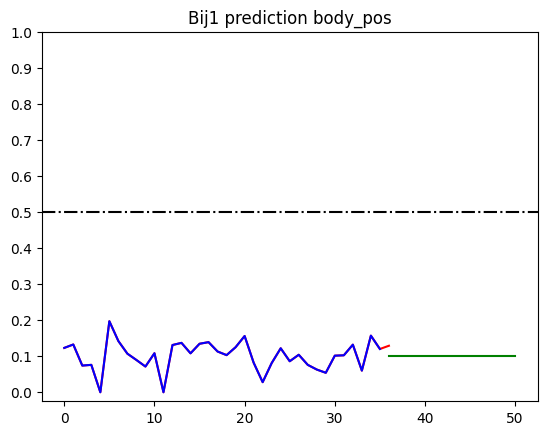

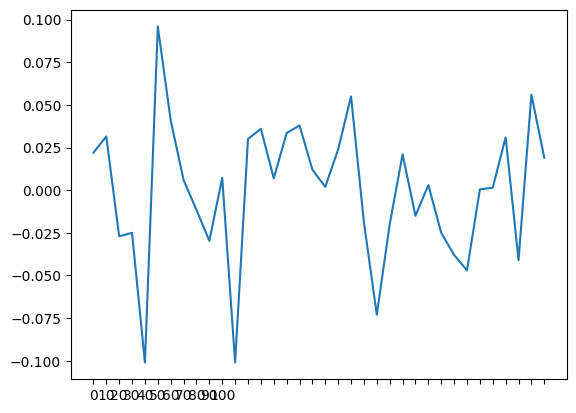

count    3.600000e+01
mean     8.945617e-12
std      4.594932e-02
min     -6.994676e-02
25%     -2.819676e-02
50%     -9.446759e-03
75%      1.730324e-02
max      1.790532e-01
dtype: float64


/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
/var/folders/9z/gq738z712wv0tz09r4b4vw6c0000gn/T/ipykernel_12835/3254081223.py:25: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_xticklabels(np.arange(0,len(party_sentiment[party_data]),10))


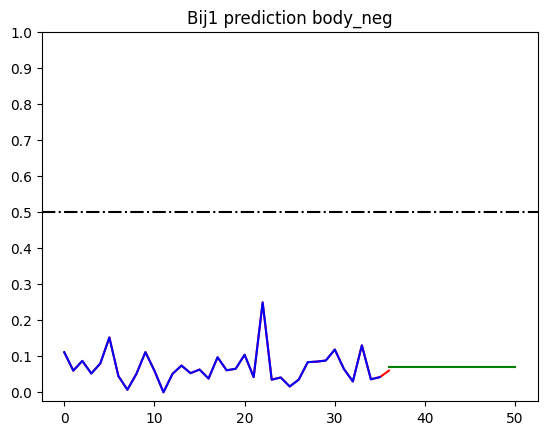

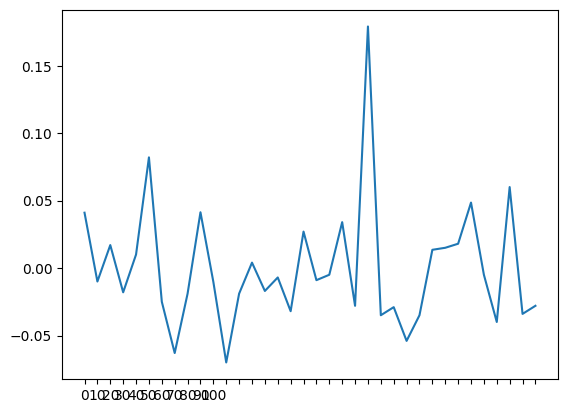

count    3.600000e+01
mean     2.580700e-09
std      7.005064e-01
min     -1.488294e+00
25%     -4.551061e-01
50%      4.700564e-01
75%      4.982564e-01
max      5.069064e-01
dtype: float64


/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
/var/folders/9z/gq738z712wv0tz09r4b4vw6c0000gn/T/ipykernel_12835/3254081223.py:25: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_xticklabels(np.arange(0,len(party_sentiment[party_data]),10))


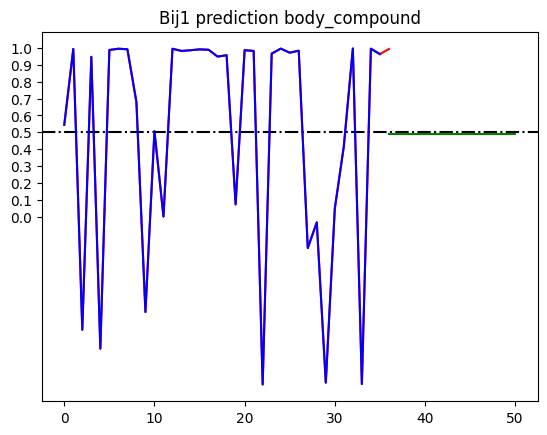

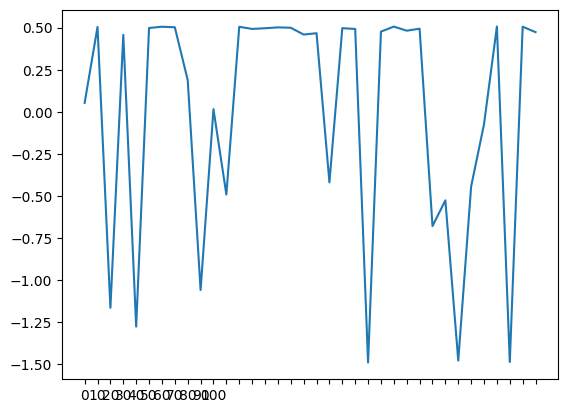

count    102.000000
mean      -0.000038
std        0.023809
min       -0.060735
25%       -0.013130
50%        0.003194
75%        0.014836
max        0.089068
dtype: float64


/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
/var/folders/9z/gq738z712wv0tz09r4b4vw6c0000gn/T/ipykernel_12835/3254081223.py:25: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_xticklabels(np.arange(0,len(party_sentiment[party_data]),10))


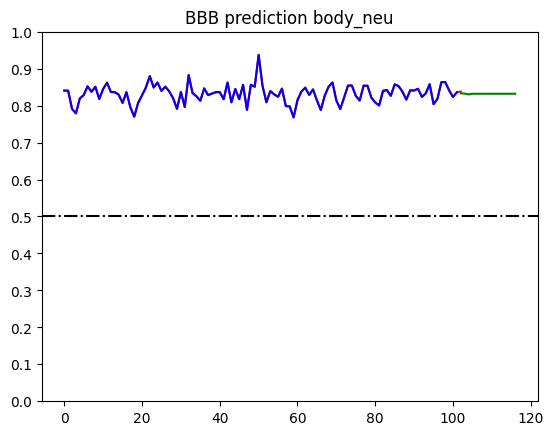

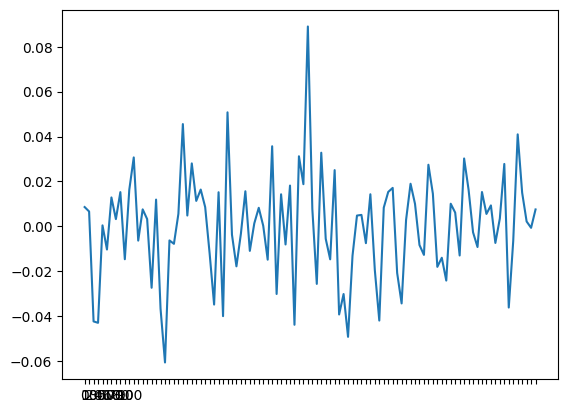

count    1.020000e+02
mean    -1.251722e-17
std      1.735891e-02
min     -5.394902e-02
25%     -1.101748e-02
50%     -7.863264e-04
75%      1.075931e-02
max      4.578431e-02
dtype: float64


/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
/var/folders/9z/gq738z712wv0tz09r4b4vw6c0000gn/T/ipykernel_12835/3254081223.py:25: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_xticklabels(np.arange(0,len(party_sentiment[party_data]),10))


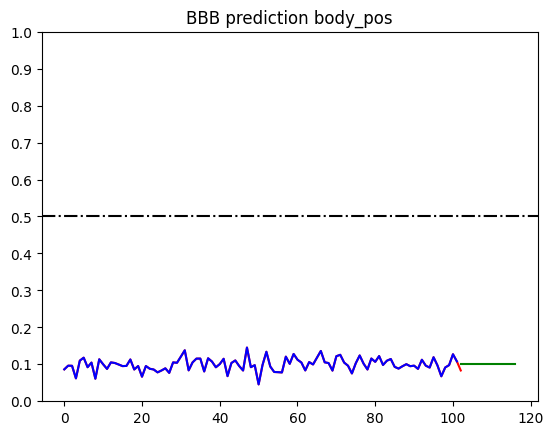

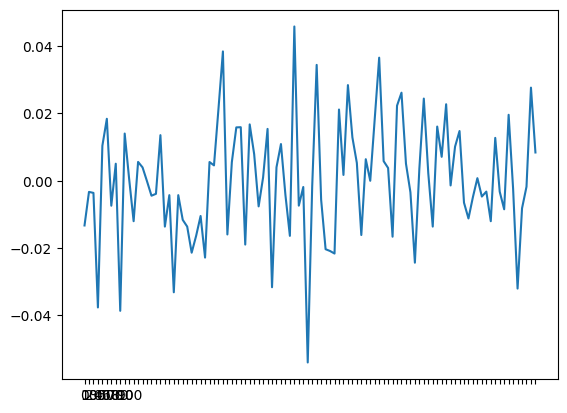

count    102.000000
mean      -0.000016
std        0.018880
min       -0.044821
25%       -0.010603
50%       -0.002276
75%        0.006847
max        0.074348
dtype: float64


/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
/var/folders/9z/gq738z712wv0tz09r4b4vw6c0000gn/T/ipykernel_12835/3254081223.py:25: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_xticklabels(np.arange(0,len(party_sentiment[party_data]),10))


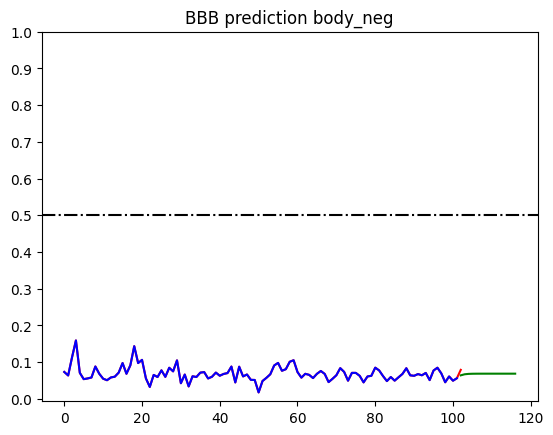

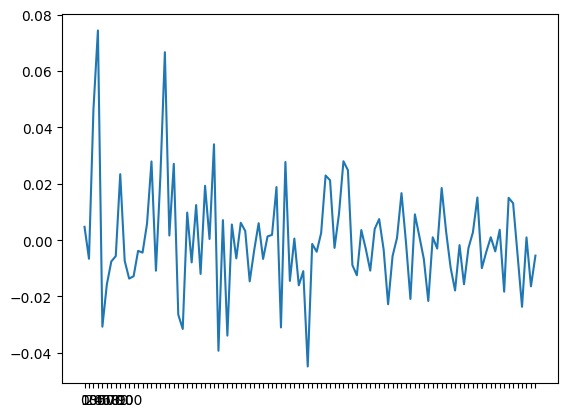

count    102.000000
mean       0.056250
std        0.374686
min       -1.227577
25%       -0.182316
50%        0.085958
75%        0.290856
max        0.882176
dtype: float64


/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
/var/folders/9z/gq738z712wv0tz09r4b4vw6c0000gn/T/ipykernel_12835/3254081223.py:25: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_xticklabels(np.arange(0,len(party_sentiment[party_data]),10))


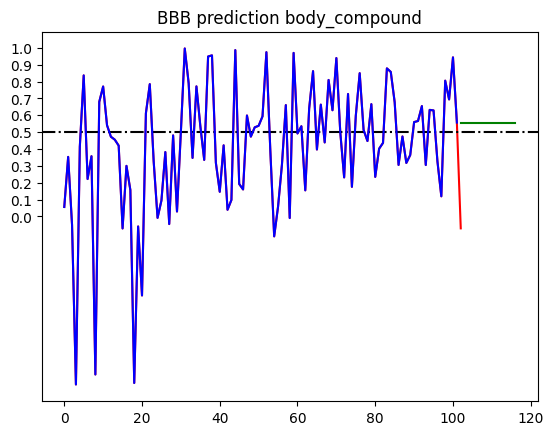

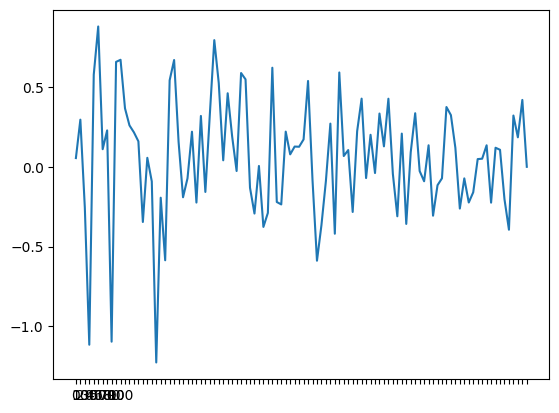

count    7.400000e+01
mean     1.084371e-11
std      3.430397e-02
min     -7.542316e-02
25%     -2.275650e-02
50%      7.018355e-04
75%      2.255600e-02
max      1.187435e-01
dtype: float64


/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
/var/folders/9z/gq738z712wv0tz09r4b4vw6c0000gn/T/ipykernel_12835/3254081223.py:25: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_xticklabels(np.arange(0,len(party_sentiment[party_data]),10))


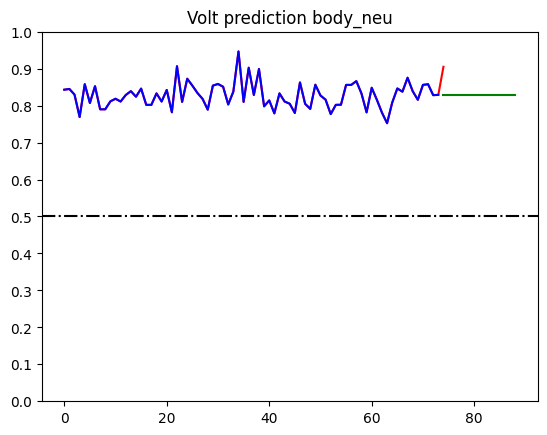

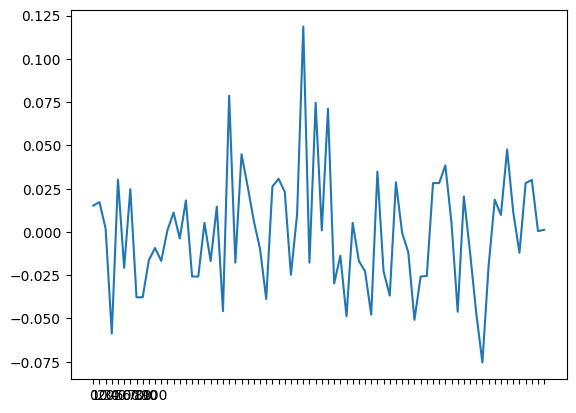

count    7.400000e+01
mean     1.411813e-11
std      2.788988e-02
min     -8.208813e-02
25%     -1.588358e-02
50%     -2.088126e-03
75%      2.124521e-02
max      6.191187e-02
dtype: float64


/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
/var/folders/9z/gq738z712wv0tz09r4b4vw6c0000gn/T/ipykernel_12835/3254081223.py:25: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_xticklabels(np.arange(0,len(party_sentiment[party_data]),10))


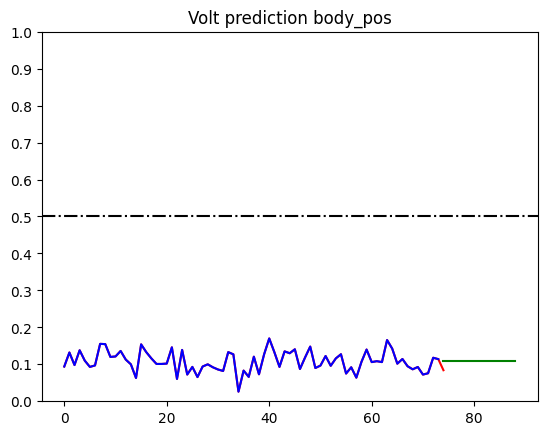

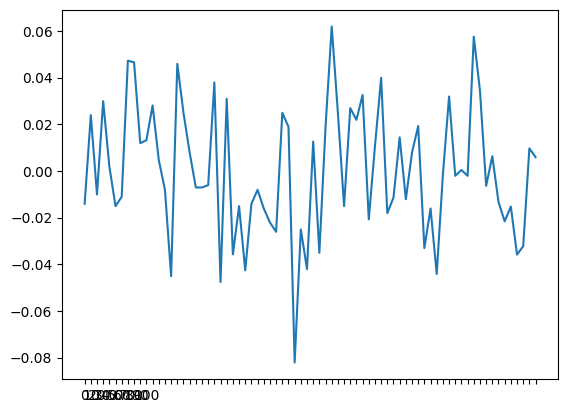

count    7.400000e+01
mean     4.797304e-12
std      2.344380e-02
min     -6.413131e-02
25%     -1.192298e-02
50%     -1.881314e-03
75%      1.149369e-02
max      6.286869e-02
dtype: float64


/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
/var/folders/9z/gq738z712wv0tz09r4b4vw6c0000gn/T/ipykernel_12835/3254081223.py:25: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_xticklabels(np.arange(0,len(party_sentiment[party_data]),10))


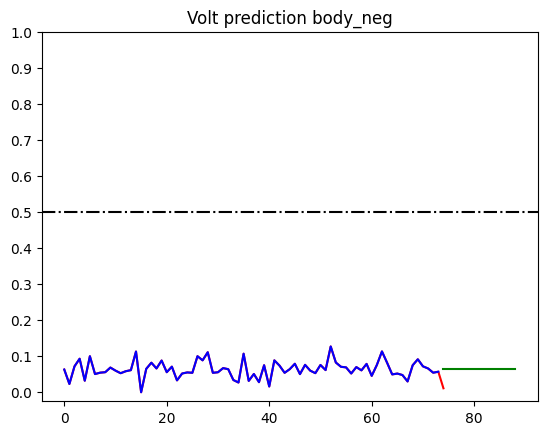

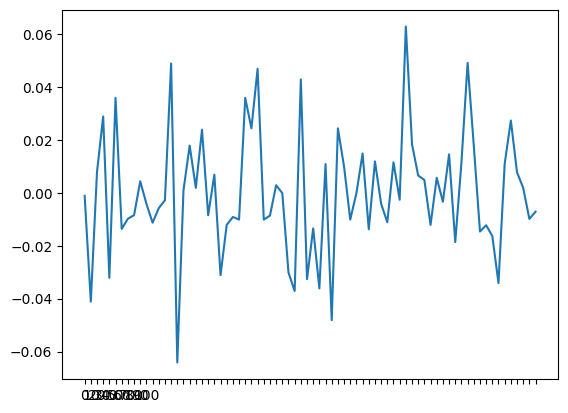

count    7.400000e+01
mean     8.151134e-11
std      5.393115e-01
min     -1.571479e+00
25%     -2.495454e-01
50%      3.027879e-01
75%      4.055296e-01
max      4.193213e-01
dtype: float64


/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
/var/folders/9z/gq738z712wv0tz09r4b4vw6c0000gn/T/ipykernel_12835/3254081223.py:25: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_xticklabels(np.arange(0,len(party_sentiment[party_data]),10))


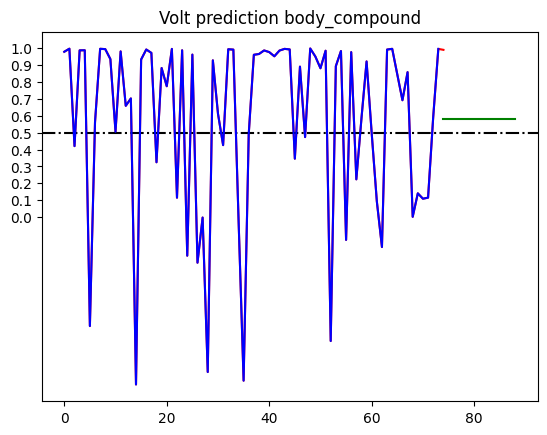

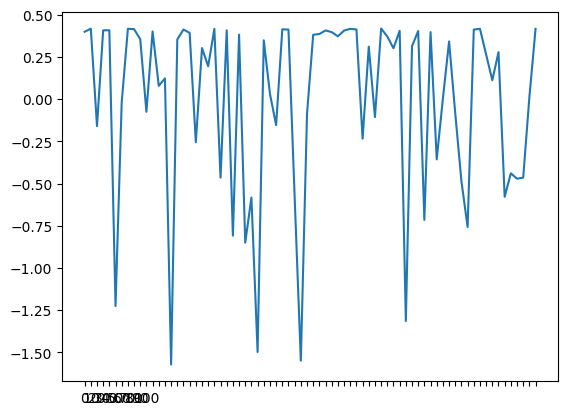

count    3.000000e+01
mean     7.694774e-12
std      4.437454e-02
min     -1.011667e-01
25%     -2.816667e-02
50%     -6.666667e-04
75%      2.445833e-02
max      1.588333e-01
dtype: float64


/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
/var/folders/9z/gq738z712wv0tz09r4b4vw6c0000gn/T/ipykernel_12835/3254081223.py:25: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_xticklabels(np.arange(0,len(party_sentiment[party_data]),10))


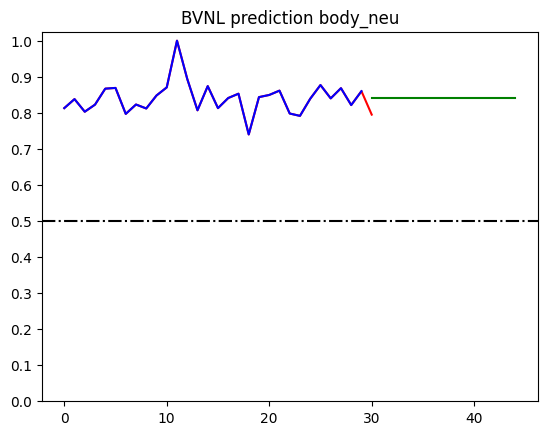

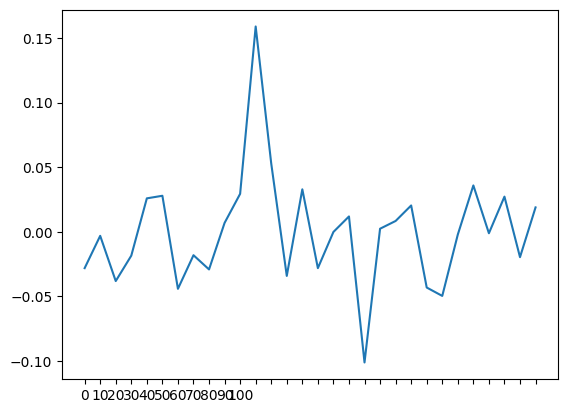

count    30.000000
mean     -0.000070
std       0.030067
min      -0.097160
25%      -0.015400
50%       0.006863
75%       0.018042
max       0.059368
dtype: float64


/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
/var/folders/9z/gq738z712wv0tz09r4b4vw6c0000gn/T/ipykernel_12835/3254081223.py:25: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_xticklabels(np.arange(0,len(party_sentiment[party_data]),10))


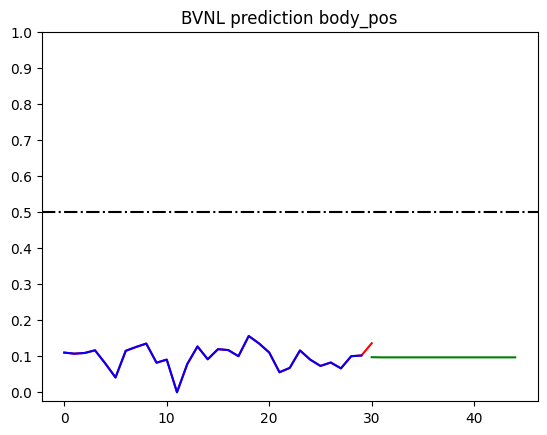

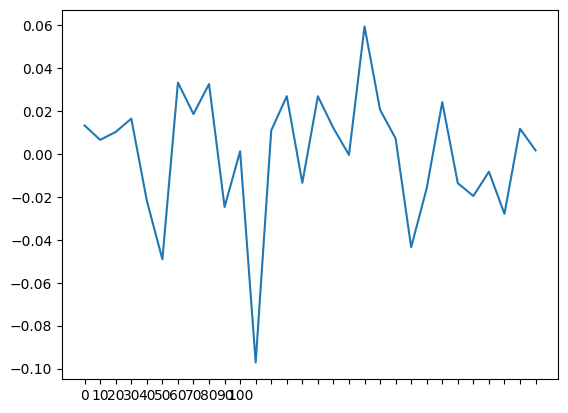

count    3.000000e+01
mean     2.942066e-11
std      2.724294e-02
min     -6.226111e-02
25%     -1.901111e-02
50%      9.055556e-04
75%      1.586389e-02
max      7.173889e-02
dtype: float64


/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
/var/folders/9z/gq738z712wv0tz09r4b4vw6c0000gn/T/ipykernel_12835/3254081223.py:25: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_xticklabels(np.arange(0,len(party_sentiment[party_data]),10))


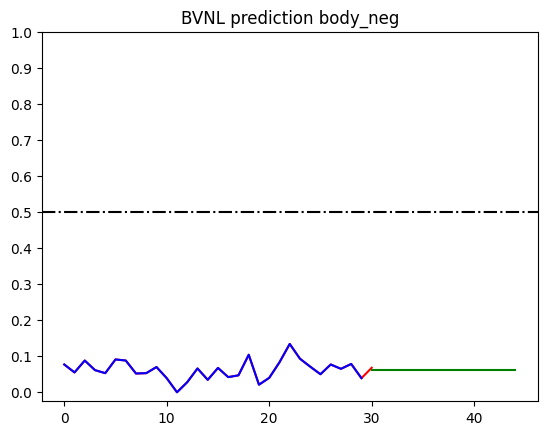

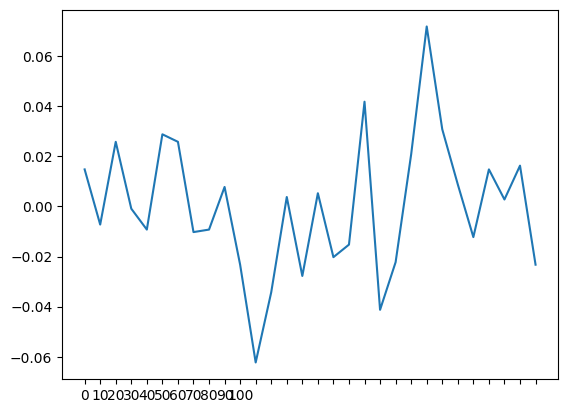

count    3.000000e+01
mean     1.448616e-09
std      4.842318e-01
min     -1.635174e+00
25%     -2.534994e-01
50%      2.610756e-01
75%      3.077006e-01
max      3.216256e-01
dtype: float64


/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
/var/folders/9z/gq738z712wv0tz09r4b4vw6c0000gn/T/ipykernel_12835/3254081223.py:25: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_xticklabels(np.arange(0,len(party_sentiment[party_data]),10))


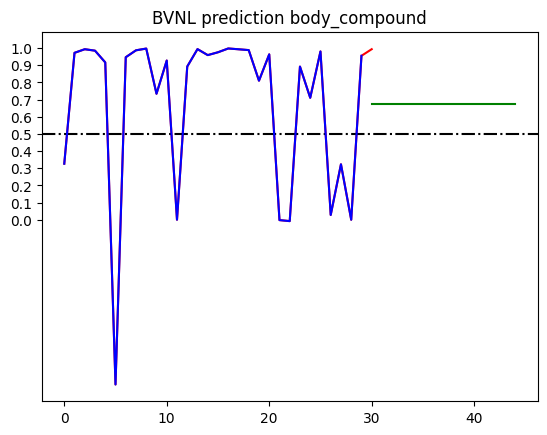

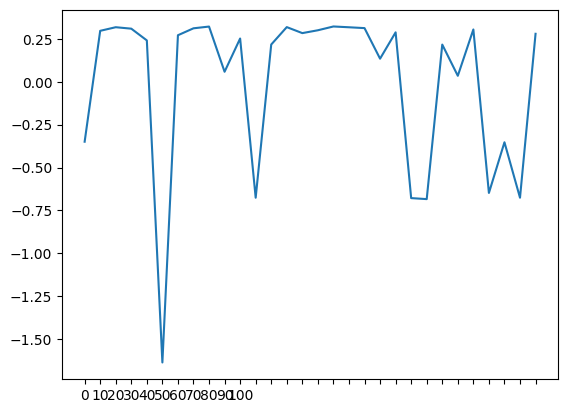

count    98.000000
mean      0.000004
std       0.027404
min      -0.077162
25%      -0.012702
50%      -0.001654
75%       0.012839
max       0.091656
dtype: float64


/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
/var/folders/9z/gq738z712wv0tz09r4b4vw6c0000gn/T/ipykernel_12835/3254081223.py:25: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_xticklabels(np.arange(0,len(party_sentiment[party_data]),10))


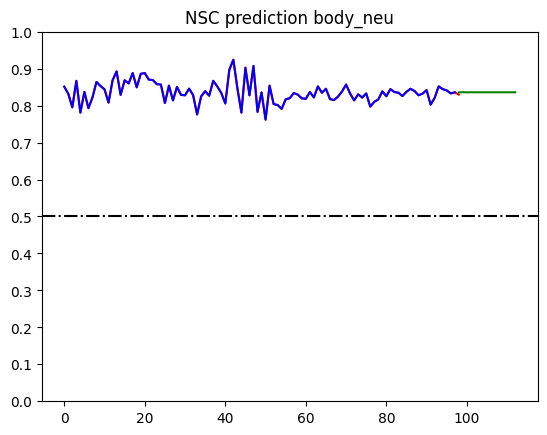

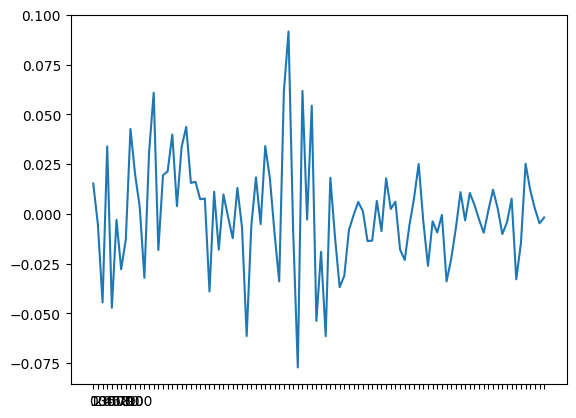

count    98.000000
mean     -0.000018
std       0.018297
min      -0.041445
25%      -0.009535
50%       0.001443
75%       0.010492
max       0.053132
dtype: float64


/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
/var/folders/9z/gq738z712wv0tz09r4b4vw6c0000gn/T/ipykernel_12835/3254081223.py:25: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_xticklabels(np.arange(0,len(party_sentiment[party_data]),10))


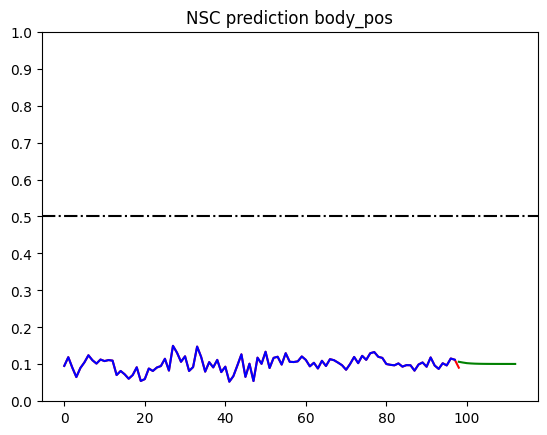

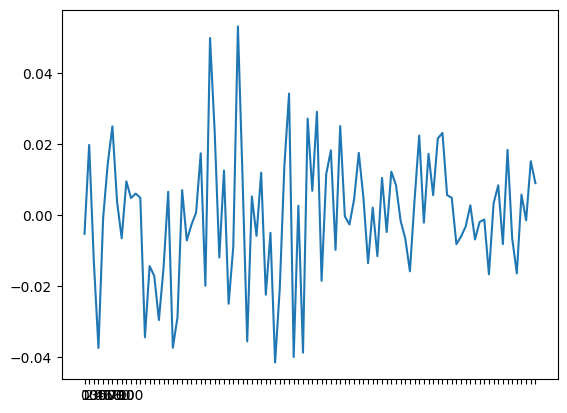

count    9.800000e+01
mean     3.447912e-13
std      1.946265e-02
min     -5.417154e-02
25%     -1.048404e-02
50%     -4.672324e-04
75%      1.041417e-02
max      6.582846e-02
dtype: float64


/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
/var/folders/9z/gq738z712wv0tz09r4b4vw6c0000gn/T/ipykernel_12835/3254081223.py:25: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_xticklabels(np.arange(0,len(party_sentiment[party_data]),10))


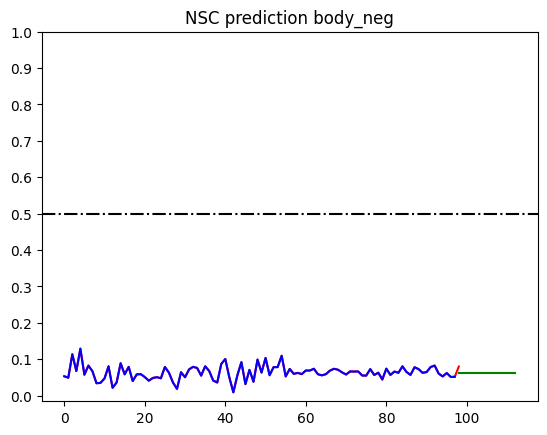

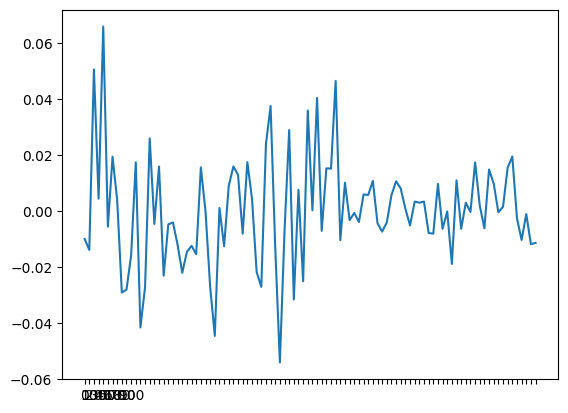

/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/niels/Library/Python/3.11/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
/var/folders/9z/gq738z712wv0tz09r4b4vw6c0000gn/T/ipykernel_12835/3254081223.py:25: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_xticklabels(np.arange(0,len(party_sentiment[party_data]),10))


count    9.800000e+01
mean     9.709802e-11
std      4.085589e-01
min     -1.459348e+00
25%     -1.743877e-01
50%      3.745817e-02
75%      3.770269e-01
max      4.514519e-01
dtype: float64


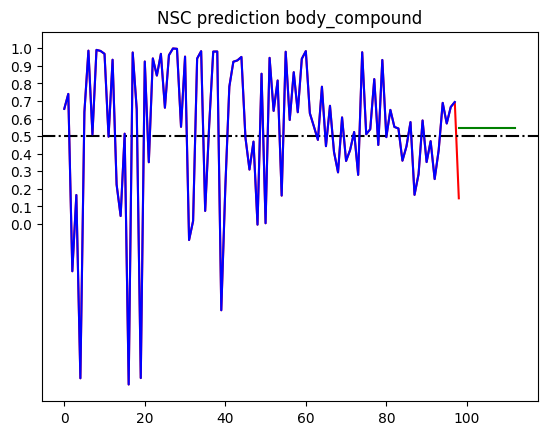

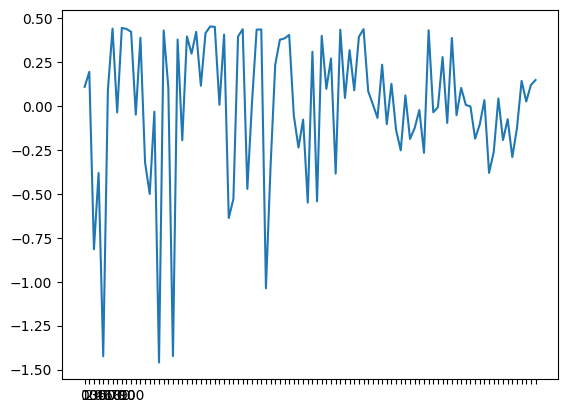

In [11]:
forecast_range = 14

for party_data in parties:
    for sentiment in sentiments:
        train_size = int(len(party_sentiment[party_data][sentiment].dropna())*0.999)
        test_size = len(party_sentiment[party_data][sentiment].dropna()) - train_size

        train,test = train_test_split(party_sentiment[party_data][sentiment].dropna(), train_size=train_size)

        model = pm.auto_arima(train)

        forecasts = model.predict(test.shape[0] + forecast_range)

        fig1, ax1 = plt.subplots()
        ax1.set_title(f"{party_data} prediction {sentiment}")
        x = np.arange(party_sentiment[party_data][sentiment].dropna().shape[0] + forecast_range)
        ax1.plot(x[:len(party_sentiment[party_data][sentiment].dropna())], party_sentiment[party_data][sentiment].dropna(), c='red')
        ax1.axhline(y = 0.5, linestyle='-.', c='black')
        ax1.plot(x[:train_size], train, c='blue')
        ax1.plot(x[train_size:], forecasts, c='green')
        ax1.set_yticks(np.arange(0,1.1,0.1))
        
        fig2, ax2 = plt.subplots()
        ax2.plot(model.resid())
        ax2.set_xticklabels(np.arange(0,len(party_sentiment[party_data]),10))
        # ax2.tick_params(axis='x', which='minor', direction='out', bottom=True, length='5')
        print(model.resid().describe())
        plt.show()

In [12]:
for party_data in parties:
    for sentiment in sentiments:
        print(f"{party_data} {sentiment} {mk.original_test(party_sentiment[party_data][sentiment])}")


VVD body_neu Mann_Kendall_Test(trend='no trend', h=False, p=0.29925252629583055, z=1.0380376516809076, Tau=0.06784354447905849, s=392.0, var_s=141882.0, slope=4.882742570712661e-05, intercept=0.8273422781792141)
VVD body_pos Mann_Kendall_Test(trend='no trend', h=False, p=0.09389340501321808, z=-1.6752081196525959, Tau=-0.10938040844582901, s=-632.0, var_s=141880.0, slope=-6.035290245816566e-05, intercept=0.10417447828815637)
VVD body_neg Mann_Kendall_Test(trend='no trend', h=False, p=0.72004268464988, z=0.35840174674404734, Tau=0.02353755624783662, s=136.0, var_s=141882.0, slope=1.4468451348150645e-05, intercept=0.06741373689593615)
VVD body_compound Mann_Kendall_Test(trend='no trend', h=False, p=0.33253913704313454, z=-0.9690121300857576, Tau=-0.06334371754932502, s=-366.0, var_s=141882.0, slope=-0.0007040129636225763, intercept=0.470751650075547)
CDA body_neu Mann_Kendall_Test(trend='no trend', h=False, p=0.3231748567290351, z=-0.9879546542039392, Tau=-0.06489155351789808, s=-368.0, 

In [13]:
from sklearn.linear_model import LinearRegression
import statsmodels.api as sm


reg = LinearRegression()
for party_data in parties:
    for sentiment in sentiments:
        reg.fit(np.arange(len(party_sentiment[party_data][sentiment].dropna())).reshape(-1,1), party_sentiment[party_data][sentiment].dropna())

        print(f"Linear model {party_data} {sentiment} is: Y = {reg.intercept_} + {reg.coef_[0]}X")


Linear model VVD body_neu is: Y = 0.8276304056084415 + 1.937585099487546e-05X
Linear model VVD body_pos is: Y = 0.1040365808324113 + -3.976466321225307e-05X
Linear model VVD body_neg is: Y = 0.06834227089094834 + 2.024382838563324e-05X
Linear model VVD body_compound is: Y = 0.46406395607349976 + -0.0005735043600335508X
Linear model CDA body_neu is: Y = 0.8322386746112745 + -5.705786330873175e-05X
Linear model CDA body_pos is: Y = 0.10116828635673897 + 8.339910153809477e-06X
Linear model CDA body_neg is: Y = 0.06657629918946568 + 4.897097798211958e-05X
Linear model CDA body_compound is: Y = 0.4362863906463017 + 6.67958907495401e-05X
Linear model D66 body_neu is: Y = 0.8346240522555107 + -5.1719363983537515e-05X
Linear model D66 body_pos is: Y = 0.10168050202452353 + 9.765477800336204e-06X
Linear model D66 body_neg is: Y = 0.06375912480844043 + 4.114646774725311e-05X
Linear model D66 body_compound is: Y = 0.4893538219517707 + 0.00013022269947444862X
Linear model SGP body_neu is: Y = 0.89

In [17]:
reg = LinearRegression()
for party_data in parties:
    for sentiment in ['body_compound']:
        reg.fit(np.arange(len(party_sentiment[party_data][sentiment].dropna())).reshape(-1,1), party_sentiment[party_data][sentiment].dropna())

        print(f"Linear model {party_data} {sentiment} is: Y = {reg.intercept_} + {reg.coef_[0]}X")

Linear model VVD body_compound is: Y = 0.46406395607349976 + -0.0005735043600335508X
Linear model CDA body_compound is: Y = 0.4362863906463017 + 6.67958907495401e-05X
Linear model D66 body_compound is: Y = 0.4893538219517707 + 0.00013022269947444862X
Linear model SGP body_compound is: Y = 0.4358290308666712 + 0.0015218764915431414X
Linear model GroenLinks-PvdA body_compound is: Y = 0.5076970387801301 + 0.0001830283272509282X
Linear model SP body_compound is: Y = 0.42454706457714353 + 0.0026408698815541345X
Linear model CU body_compound is: Y = 0.6176956332509629 + -0.002403182794965004X
Linear model PvdD body_compound is: Y = 0.47731197494728883 + -0.0002853393230937169X
Linear model PVV body_compound is: Y = 0.5816732720335279 + -0.0011815045349403753X
Linear model 50Plus body_compound is: Y = 0.23028120071684613 + 0.01622357619577306X
Linear model Denk body_compound is: Y = 0.427074437924535 + 0.0004038329187786643X
Linear model FvD body_compound is: Y = 0.750478548877283 + -0.006233

In [15]:
for party_data in parties:
    for sentiment in sentiments:
        x = np.arange(len(party_sentiment[party_data][sentiment].dropna()))
        x = sm.add_constant(x)
        y = party_sentiment[party_data][sentiment].dropna()
        est = sm.OLS(y, x).fit()

        print(party_data)
        print(est.summary())


VVD
                            OLS Regression Results                            
Dep. Variable:               body_neu   R-squared:                       0.001
Model:                            OLS   Adj. R-squared:                 -0.009
Method:                 Least Squares   F-statistic:                   0.08479
Date:                 wo, 20 dec 2023   Prob (F-statistic):              0.771
Time:                        12:03:47   Log-Likelihood:                 262.16
No. Observations:                 108   AIC:                            -520.3
Df Residuals:                     106   BIC:                            -515.0
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.8276      0.004    200.871     

In [16]:
party_sentiment

{'50Plus':             body_compound  body_neg  body_neu  body_pos  title_compound  \
 2023-08-21            NaN       NaN       NaN       NaN             NaN   
 2023-08-22        -0.9707     0.125     0.800     0.075             0.0   
 2023-08-23         0.9997     0.039     0.794     0.167             0.0   
 2023-08-24            NaN       NaN       NaN       NaN             NaN   
 2023-08-25            NaN       NaN       NaN       NaN             NaN   
 ...                   ...       ...       ...       ...             ...   
 2023-12-03            NaN       NaN       NaN       NaN             NaN   
 2023-12-04            NaN       NaN       NaN       NaN             NaN   
 2023-12-05            NaN       NaN       NaN       NaN             NaN   
 2023-12-06            NaN       NaN       NaN       NaN             NaN   
 2023-12-07            NaN       NaN       NaN       NaN             NaN   
 
             title_neg  title_neu  title_pos  
 2023-08-21        NaN       